In [0]:
pip install geopandas

[Monitor] stop monitoring


Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 15.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 77.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 38.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 76.4 MB/s eta 0:00:00
Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.


In [0]:
# import libraries
import math
import re
import os
import pandas as pd
import numpy as np
import datetime as dt
import urllib
import zipfile
import gc
from io import BytesIO
from param_spec import COUNTRY_CODE, DATABASE_NAME, EVENT_TABLE, ERROR_TABLE
from util import get_last_timestamp
import warnings
warnings.simplefilter('ignore', FutureWarning)

from pyspark.sql.types import StructType, StructField, StringType

#libraries for visualisations and tables
import matplotlib.pyplot as plt
import seaborn as sns
# import geopandas as gpd
#from shapely.geometry import Point
#from wordcloud import WordCloud

In [0]:
start_date = "2022-03-15"
end_date = "2022-07-31"

In [0]:
start_date = "2024-01-01"
end_date = "2024-03-31"

In [0]:
start_date = "2021-12-01"
end_date = "2022-03-15"

In [0]:
# define search range (15 min chunks in each day)
def get_date_time_intervals(_start_date, _end_date):
    _date_time_range = []
    _range = pd.date_range(start=_start_date, end=_end_date, freq='15T')
    for _date in _range:
        _date_time_range.append(str(_date))
    return _date_time_range

# get dates
date_range = get_date_time_intervals(start_date, end_date)

#exclude last time frame published at midnight for last 15 min from day before
date_range = date_range[:-1]
print('Number of time intervals:', len(date_range))

Number of time intervals: 8640


In [0]:
# define GDELT schema
gdelt_event_url = "https://raw.githubusercontent.com/linwoodc3/gdelt2HeaderRows/master/schema_csvs/GDELT_2.0_Events_Column_Labels_Header_Row_Sep2016.csv"
gdelt_events_schema = pd.read_csv(gdelt_event_url, sep=',')
gdelt_events_headers = gdelt_events_schema['tableId'].values

In [0]:
gdelt_events_schema

In [0]:
#with pd.option_context('display.max_rows', None, 'display.max_colwidth', None):
    #print(gdelt_events_schema)

row_index = 25

with pd.option_context('display.max_columns', None, 'display.max_colwidth', None):
    print(gdelt_events_schema.loc[row_index])

tableId                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      IsRootEvent
dataType                                                                                                                                                                                                                                                                                       

In [0]:
# get data from Events 2.0 in batches

idx_date = 0
batch_size_date = 96
total_range = len(date_range)
num_batches_date = math.ceil(total_range / batch_size_date) # num of the batches
gdelt_data_full_search = pd.DataFrame()
error_df = pd.DataFrame()

for batch in range(num_batches_date):
    print('Batch:', batch)
    # instatiate df for batch of news
    _gdelt_data_batch = pd.DataFrame()

    for count, date in enumerate(date_range[idx_date:idx_date+batch_size_date]):
        if count % 48 == 0:
            print(date)
        _date = re.sub(r'[^\d+]','', date)
        try:
            # fetch gdelt events data
            _gdelt_data = pd.read_csv(f"http://data.gdeltproject.org/gdeltv2/{_date}.export.CSV.zip", 
                                      lineterminator='\n', delimiter='\t', encoding='utf8', header=None, compression='zip')
            _gdelt_data.columns = gdelt_events_headers
            # remove undated rows
            _gdelt_data = _gdelt_data.dropna(subset=['SQLDATE']) 
            # append news to df for batch
            _gdelt_data_batch = pd.concat([_gdelt_data_batch, _gdelt_data])
        except Exception as e:
            edf = pd.DataFrame({'date':[_date], 'data':['events2'], 'error':[str(e)]})
            error_df = pd.concat([error_df, edf])
            print(f'#### FAILED AT {date} ####')

    # reset index
    _gdelt_data_batch.reset_index(inplace=True, drop=True)
    # shape of unmodified events from batch
    print('ALL GDELT 2.0 events in batch:', _gdelt_data_batch.shape)
    # select data from events for defined country 
    # note: we are not filtering by Actor1CountryCode (and 2) because they do not seem to be accurate
    _gdelt_data_batch = _gdelt_data_batch.loc[(_gdelt_data_batch.ActionGeo_CountryCode == COUNTRY_CODE) | 
                                              (_gdelt_data_batch.Actor1Geo_CountryCode == COUNTRY_CODE) | 
                                              (_gdelt_data_batch.Actor2Geo_CountryCode == COUNTRY_CODE)].copy()
    print('Number of country relevant events:', _gdelt_data_batch.shape[0])
    # reset index
    _gdelt_data_batch.reset_index(inplace=True, drop=True)
    # append batch to full search results df
    gdelt_data_full_search = pd.concat([gdelt_data_full_search, _gdelt_data_batch])
    # unpdate indices for next batch
    idx_date += batch_size_date

    # clear batch variables from memory
    del _gdelt_data_batch
    gc.collect()
    del _gdelt_data
    gc.collect()
    
gdelt_data_full_search.reset_index(inplace=True, drop=True)

Batch: 0
2024-01-01 00:00:00
2024-01-01 12:00:00
ALL GDELT 2.0 events in batch: (67623, 61)
Number of country relevant events: 330
Batch: 1
2024-01-02 00:00:00
2024-01-02 12:00:00
ALL GDELT 2.0 events in batch: (107010, 61)
Number of country relevant events: 282
Batch: 2
2024-01-03 00:00:00
2024-01-03 12:00:00
ALL GDELT 2.0 events in batch: (124453, 61)
Number of country relevant events: 491
Batch: 3
2024-01-04 00:00:00
2024-01-04 12:00:00
ALL GDELT 2.0 events in batch: (137068, 61)
Number of country relevant events: 375
Batch: 4
2024-01-05 00:00:00
2024-01-05 12:00:00
ALL GDELT 2.0 events in batch: (131775, 61)
Number of country relevant events: 355
Batch: 5
2024-01-06 00:00:00
2024-01-06 12:00:00
ALL GDELT 2.0 events in batch: (87905, 61)
Number of country relevant events: 278
Batch: 6
2024-01-07 00:00:00
2024-01-07 12:00:00
ALL GDELT 2.0 events in batch: (76050, 61)
Number of country relevant events: 175
Batch: 7
2024-01-08 00:00:00
2024-01-08 12:00:00
ALL GDELT 2.0 events in batch:

In [0]:
gdelt_data_full_search.head(5)

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-2676439573695222>, line 1
----> 1 gdelt_data_full_search.head(5)

NameError: name 'gdelt_data_full_search' is not defined

In [0]:
# minor cleaning - drop columns
gdelt_data_full_search = gdelt_data_full_search.drop(columns=['MonthYear', 'Year', 'FractionDate'])
print(gdelt_data_full_search.shape)

(36347, 58)


In [0]:
gdelt_data_full_search.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 86437 entries, 0 to 86436
Data columns (total 58 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   GLOBALEVENTID          86437 non-null  int64  
 1   SQLDATE                86437 non-null  int64  
 2   Actor1Code             79984 non-null  object 
 3   Actor1Name             79984 non-null  object 
 4   Actor1CountryCode      45666 non-null  object 
 5   Actor1KnownGroupCode   1631 non-null   object 
 6   Actor1EthnicCode       860 non-null    object 
 7   Actor1Religion1Code    714 non-null    object 
 8   Actor1Religion2Code    218 non-null    object 
 9   Actor1Type1Code        43712 non-null  object 
 10  Actor1Type2Code        4141 non-null   object 
 11  Actor1Type3Code        155 non-null    object 
 12  Actor2Code             67748 non-null  object 
 13  Actor2Name             67748 non-null  object 
 14  Actor2CountryCode      38272 non-null  object 
 15  Ac

In [0]:
# To get the exact dates from 01 Dec 21 - 15 Mar 2022 (script, at times, gets news from other time periods)

def generate_number_range(start, end):
    return [i for i in range(start, end + 1)]

# Define the number ranges
ranges = [
    (20211201, 2021031),
    (20220101, 20220131),
    (20220201, 20220228),
    (20220301, 20220315)
]

# Generate the number lists
full_dates = []
for start, end in ranges:
    full_dates.extend(generate_number_range(start, end))

# Print the list
print(full_dates)

[20220101, 20220102, 20220103, 20220104, 20220105, 20220106, 20220107, 20220108, 20220109, 20220110, 20220111, 20220112, 20220113, 20220114, 20220115, 20220116, 20220117, 20220118, 20220119, 20220120, 20220121, 20220122, 20220123, 20220124, 20220125, 20220126, 20220127, 20220128, 20220129, 20220130, 20220131, 20220201, 20220202, 20220203, 20220204, 20220205, 20220206, 20220207, 20220208, 20220209, 20220210, 20220211, 20220212, 20220213, 20220214, 20220215, 20220216, 20220217, 20220218, 20220219, 20220220, 20220221, 20220222, 20220223, 20220224, 20220225, 20220226, 20220227, 20220228, 20220301, 20220302, 20220303, 20220304, 20220305, 20220306, 20220307, 20220308, 20220309, 20220310, 20220311, 20220312, 20220313, 20220314, 20220315]


In [0]:
#pre-aragalaya dates
Pre = [20220101, 20220102, 20220103, 20220104, 20220105, 20220106, 20220107, 20220108, 20220109, 20220110, 20220111, 20220112, 20220113, 20220114, 20220115, 20220116, 20220117, 20220118, 20220119, 20220120, 20220121, 20220122, 20220123, 20220124, 20220125, 20220126, 20220127, 20220128, 20220129, 20220130, 20220131, 20220201, 20220202, 20220203, 20220204, 20220205, 20220206, 20220207, 20220208, 20220209, 20220210, 20220211, 20220212, 20220213, 20220214, 20220215, 20220216, 20220217, 20220218, 20220219, 20220220, 20220221, 20220222, 20220223, 20220224, 20220225, 20220226, 20220227, 20220228, 20220301, 20220302, 20220303, 20220304, 20220305, 20220306, 20220307, 20220308, 20220309, 20220310, 20220311, 20220312, 20220313, 20220314, 20220315]

# Filter the DataFrame based on the specific dates
pre_crisis = gdelt_data_full_search[gdelt_data_full_search['SQLDATE'].isin(Pre)]

# convert SQLDATE to date.time
pre_crisis['SQLDATE'] = pd.to_datetime(pre_crisis['SQLDATE'], format='%Y%m%d')

/root/.ipykernel/1107/command-3511409162585189-440820606:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pre_crisis['SQLDATE'] = pd.to_datetime(pre_crisis['SQLDATE'], format='%Y%m%d')


In [0]:
# To get the exact dates from 01 - 31 Jan 2022 (script, at times, gets news from other time periods)

def generate_number_range(start, end):
    return [i for i in range(start, end + 1)]

# Define the number ranges
ranges = [
    (20220101, 20220131)
]

# Generate the number lists
full_dates = []
for start, end in ranges:
    full_dates.extend(generate_number_range(start, end))

# Print the list
print(full_dates)

[20220101, 20220102, 20220103, 20220104, 20220105, 20220106, 20220107, 20220108, 20220109, 20220110, 20220111, 20220112, 20220113, 20220114, 20220115, 20220116, 20220117, 20220118, 20220119, 20220120, 20220121, 20220122, 20220123, 20220124, 20220125, 20220126, 20220127, 20220128, 20220129, 20220130, 20220131]


In [0]:
#Jan dates

Jan = [20220101, 20220102, 20220103, 20220104, 20220105, 20220106, 20220107, 20220108, 20220109, 20220110, 20220111, 20220112, 20220113, 20220114, 20220115, 20220116, 20220117, 20220118, 20220119, 20220120, 20220121, 20220122, 20220123, 20220124, 20220125, 20220126, 20220127, 20220128, 20220129, 20220130, 20220131]

# Filter the DataFrame based on the specific dates
Jan_data = gdelt_data_full_search[gdelt_data_full_search['SQLDATE'].isin(Jan)]

# convert SQLDATE to date.time
Jan_data['SQLDATE'] = pd.to_datetime(Jan_data['SQLDATE'], format='%Y%m%d')

/root/.ipykernel/11505/command-458367799176560-710149161:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Jan_data['SQLDATE'] = pd.to_datetime(Jan_data['SQLDATE'], format='%Y%m%d')


In [0]:
# To get the exact dates from 15 Mar - 31 Jul 2022 (script, at times, gets news from other time periods)

def generate_number_range(start, end):
    return [i for i in range(start, end + 1)]

# Define the number ranges
ranges = [
    (20220315, 20220331),
    (20220401, 20220430),
    (20220501, 20220531),
    (20220601, 20220630),
    (20220701, 20220731)
]

# Generate the number lists
full_dates = []
for start, end in ranges:
    full_dates.extend(generate_number_range(start, end))

# Print the list
print(full_dates)

[20220315, 20220316, 20220317, 20220318, 20220319, 20220320, 20220321, 20220322, 20220323, 20220324, 20220325, 20220326, 20220327, 20220328, 20220329, 20220330, 20220331, 20220401, 20220402, 20220403, 20220404, 20220405, 20220406, 20220407, 20220408, 20220409, 20220410, 20220411, 20220412, 20220413, 20220414, 20220415, 20220416, 20220417, 20220418, 20220419, 20220420, 20220421, 20220422, 20220423, 20220424, 20220425, 20220426, 20220427, 20220428, 20220429, 20220430, 20220501, 20220502, 20220503, 20220504, 20220505, 20220506, 20220507, 20220508, 20220509, 20220510, 20220511, 20220512, 20220513, 20220514, 20220515, 20220516, 20220517, 20220518, 20220519, 20220520, 20220521, 20220522, 20220523, 20220524, 20220525, 20220526, 20220527, 20220528, 20220529, 20220530, 20220531, 20220601, 20220602, 20220603, 20220604, 20220605, 20220606, 20220607, 20220608, 20220609, 20220610, 20220611, 20220612, 20220613, 20220614, 20220615, 20220616, 20220617, 20220618, 20220619, 20220620, 20220621, 20220622,

In [0]:
# To get the exact dates from 01 Jan 2024 - 31 Mar 2024 (script, at times, gets news from other time periods)

def generate_number_range(start, end):
    return [i for i in range(start, end + 1)]

# Define the number ranges
ranges = [
    (20240101, 20240331)
]

# Generate the number lists
dates24 = []
for start, end in ranges:
    dates24.extend(generate_number_range(start, end))

# Print the list
print(dates24)

[20240101, 20240102, 20240103, 20240104, 20240105, 20240106, 20240107, 20240108, 20240109, 20240110, 20240111, 20240112, 20240113, 20240114, 20240115, 20240116, 20240117, 20240118, 20240119, 20240120, 20240121, 20240122, 20240123, 20240124, 20240125, 20240126, 20240127, 20240128, 20240129, 20240130, 20240131, 20240132, 20240133, 20240134, 20240135, 20240136, 20240137, 20240138, 20240139, 20240140, 20240141, 20240142, 20240143, 20240144, 20240145, 20240146, 20240147, 20240148, 20240149, 20240150, 20240151, 20240152, 20240153, 20240154, 20240155, 20240156, 20240157, 20240158, 20240159, 20240160, 20240161, 20240162, 20240163, 20240164, 20240165, 20240166, 20240167, 20240168, 20240169, 20240170, 20240171, 20240172, 20240173, 20240174, 20240175, 20240176, 20240177, 20240178, 20240179, 20240180, 20240181, 20240182, 20240183, 20240184, 20240185, 20240186, 20240187, 20240188, 20240189, 20240190, 20240191, 20240192, 20240193, 20240194, 20240195, 20240196, 20240197, 20240198, 20240199, 20240200,

In [0]:
# Jan 2024 dates

Jan24 = [20240101, 20240102, 20240103, 20240104, 20240105, 20240106, 20240107, 20240108, 20240109, 20240110, 20240111, 20240112, 20240113, 20240114, 20240115, 20240116, 20240117, 20240118, 20240119, 20240120, 20240121, 20240122, 20240123, 20240124, 20240125, 20240126, 20240127, 20240128, 20240129, 20240130, 20240131, 20240132, 20240133, 20240134, 20240135, 20240136, 20240137, 20240138, 20240139, 20240140, 20240141, 20240142, 20240143, 20240144, 20240145, 20240146, 20240147, 20240148, 20240149, 20240150, 20240151, 20240152, 20240153, 20240154, 20240155, 20240156, 20240157, 20240158, 20240159, 20240160, 20240161, 20240162, 20240163, 20240164, 20240165, 20240166, 20240167, 20240168, 20240169, 20240170, 20240171, 20240172, 20240173, 20240174, 20240175, 20240176, 20240177, 20240178, 20240179, 20240180, 20240181, 20240182, 20240183, 20240184, 20240185, 20240186, 20240187, 20240188, 20240189, 20240190, 20240191, 20240192, 20240193, 20240194, 20240195, 20240196, 20240197, 20240198, 20240199, 20240200, 20240201, 20240202, 20240203, 20240204, 20240205, 20240206, 20240207, 20240208, 20240209, 20240210, 20240211, 20240212, 20240213, 20240214, 20240215, 20240216, 20240217, 20240218, 20240219, 20240220, 20240221, 20240222, 20240223, 20240224, 20240225, 20240226, 20240227, 20240228, 20240229, 20240230, 20240231, 20240232, 20240233, 20240234, 20240235, 20240236, 20240237, 20240238, 20240239, 20240240, 20240241, 20240242, 20240243, 20240244, 20240245, 20240246, 20240247, 20240248, 20240249, 20240250, 20240251, 20240252, 20240253, 20240254, 20240255, 20240256, 20240257, 20240258, 20240259, 20240260, 20240261, 20240262, 20240263, 20240264, 20240265, 20240266, 20240267, 20240268, 20240269, 20240270, 20240271, 20240272, 20240273, 20240274, 20240275, 20240276, 20240277, 20240278, 20240279, 20240280, 20240281, 20240282, 20240283, 20240284, 20240285, 20240286, 20240287, 20240288, 20240289, 20240290, 20240291, 20240292, 20240293, 20240294, 20240295, 20240296, 20240297, 20240298, 20240299, 20240300, 20240301, 20240302, 20240303, 20240304, 20240305, 20240306, 20240307, 20240308, 20240309, 20240310, 20240311, 20240312, 20240313, 20240314, 20240315, 20240316, 20240317, 20240318, 20240319, 20240320, 20240321, 20240322, 20240323, 20240324, 20240325, 20240326, 20240327, 20240328, 20240329, 20240330, 20240331]

# Filter the DataFrame based on the specific dates
Jan24_data = gdelt_data_full_search[gdelt_data_full_search['SQLDATE'].isin(March)]

# convert SQLDATE to date.time
Jan24_data['SQLDATE'] = pd.to_datetime(Jan24_data['SQLDATE'], format='%Y%m%d')

Jan24_data.to_csv('aragalaya_data.csv')

In [0]:
#March dates

March = [20220315, 20220316, 20220317, 20220318, 20220319, 20220320, 20220321, 20220322, 20220323, 20220324, 20220325, 20220326, 20220327, 20220328, 20220329, 20220330, 20220331, 20220401]

# Filter the DataFrame based on the specific dates
March_data = gdelt_data_full_search[gdelt_data_full_search['SQLDATE'].isin(March)]

# convert SQLDATE to date.time
March_data['SQLDATE'] = pd.to_datetime(March_data['SQLDATE'], format='%Y%m%d')

/root/.ipykernel/1107/command-2969038561603017-1711313331:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  March_data['SQLDATE'] = pd.to_datetime(March_data['SQLDATE'], format='%Y%m%d')


In [0]:
May = [20220425, 20220426, 20220427, 20220428, 20220429, 20220430, 20220501, 20220502, 20220503, 20220504, 20220505, 20220506, 20220507, 20220508, 20220509, 20220510, 20220511, 20220512, 20220513, 20220514, 20220515, 20220516, 20220517, 20220518, 20220519]

# Filter the DataFrame based on the specific dates
May_data = gdelt_data_full_search[gdelt_data_full_search['SQLDATE'].isin(May)]

May_data['SQLDATE'] = pd.to_datetime(May_data['SQLDATE'], format='%Y%m%d')

/root/.ipykernel/1107/command-2969038561603020-3602998731:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  May_data['SQLDATE'] = pd.to_datetime(May_data['SQLDATE'], format='%Y%m%d')


In [0]:
June = [20220615, 20220616, 20220617, 20220618, 20220619, 20220620, 20220621, 20220622, 20220623, 20220624, 20220625, 20220626, 20220627, 20220628, 20220629, 20220630, 20220701, 20220702, 20220703, 20220704, 20220705, 20220706, 20220707, 20220708, 20220709, 20220710, 20220711, 20220712, 20220713, 20220714, 20220715, 20220716, 20220717, 20220718, 20220719, 20220720, 20220721, 20220722, 20220723, 20220724, 20220725, 20220726, 20220727, 20220728, 20220729, 20220730, 20220731]

# Filter the DataFrame based on the specific dates
June_data = gdelt_data_full_search[gdelt_data_full_search['SQLDATE'].isin(June)]

June_data['SQLDATE'] = pd.to_datetime(June_data['SQLDATE'], format='%Y%m%d')

/root/.ipykernel/1107/command-2157817838397500-2067572158:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  June_data['SQLDATE'] = pd.to_datetime(June_data['SQLDATE'], format='%Y%m%d')


In [0]:
# Filter the DataFrame based on the specific dates
aragalaya = gdelt_data_full_search[gdelt_data_full_search['SQLDATE'].isin(full_dates)]

aragalaya['SQLDATE'] = pd.to_datetime(aragalaya['SQLDATE'], format='%Y%m%d')

/root/.ipykernel/1107/command-2969038561603022-2755102561:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  aragalaya['SQLDATE'] = pd.to_datetime(aragalaya['SQLDATE'], format='%Y%m%d')


In [0]:
### save the aragalaya dataset
aragalaya.to_csv('aragalaya_data.csv')

In [0]:
### save the pre-aragalaya dataset
pre_crisis.to_csv('pre_aragalaya_data.csv')

In [0]:
#Testing subset - event codes only
events_codes = aragalaya[["IsRootEvent", "EventCode", "EventBaseCode", "EventRootCode", "QuadClass", "GoldsteinScale", "NumMentions", "NumSources", "NumArticles", "AvgTone"]]
events_codes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 85970 entries, 0 to 86436
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   IsRootEvent     85970 non-null  int64  
 1   EventCode       85970 non-null  object 
 2   EventBaseCode   85970 non-null  object 
 3   EventRootCode   85970 non-null  object 
 4   QuadClass       85970 non-null  int64  
 5   GoldsteinScale  85970 non-null  float64
 6   NumMentions     85970 non-null  int64  
 7   NumSources      85970 non-null  int64  
 8   NumArticles     85970 non-null  int64  
 9   AvgTone         85970 non-null  float64
dtypes: float64(2), int64(5), object(3)
memory usage: 7.2+ MB


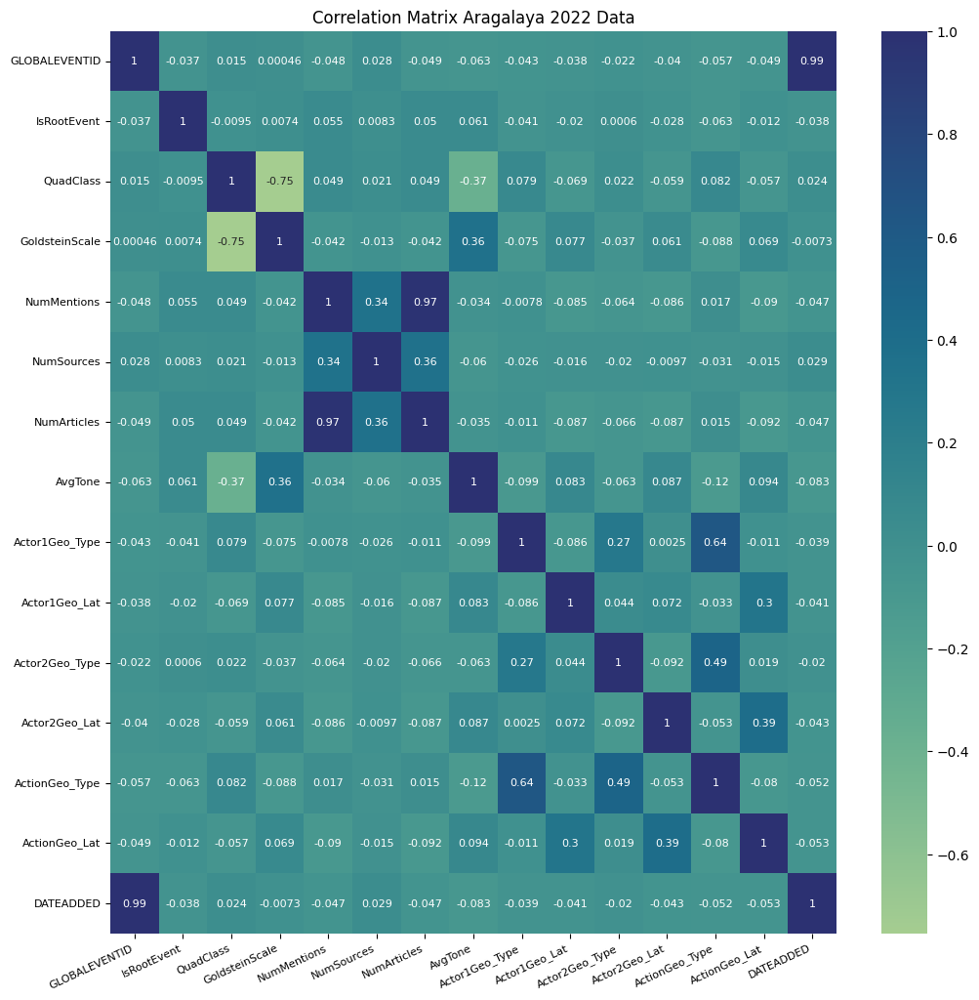

In [0]:
#correlation analysis of variables - Mar-Jul 22

# Increase display width and precision
corr_matrix = aragalaya.corr()

plt.figure(figsize=(12,12)) 

heatmap = sns.heatmap(corr_matrix, annot=True, cmap="crest", annot_kws={"size": 8})
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=25, ha='right')

plt.yticks(fontsize=8)
plt.xticks(fontsize=8)

plt.title("Correlation Matrix Aragalaya 2022 Data")
#plt.savefig("Correlation Matrix.png")
plt.show()

# Strong correlations between EventBaseCode and EventRootCode with QuadClass
# EventBaseCode, EventRootCode, QuadClass all negatively correlated to GoldsteinScale

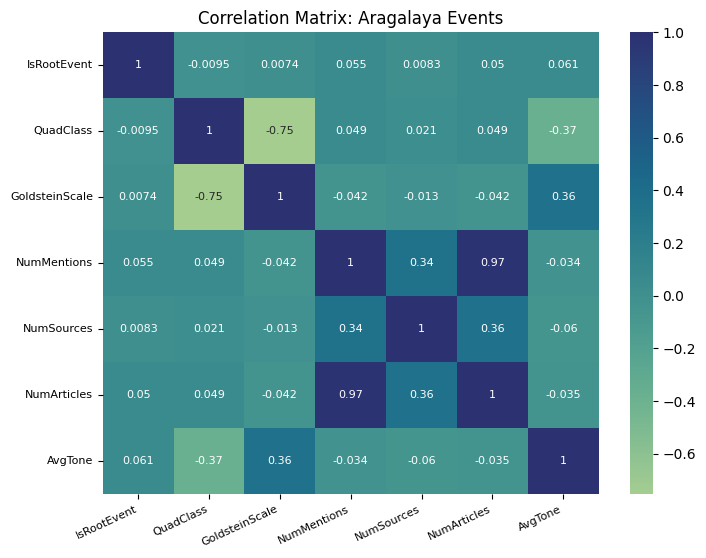

In [0]:
#correlation analysis of variables aragalaya
corr_matrix = events_codes.corr()

plt.figure(figsize=(8,6)) 

heatmap = sns.heatmap(corr_matrix, annot=True, cmap="crest", annot_kws={"size": 8})
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=25, ha='right')

plt.yticks(fontsize=8)
plt.xticks(fontsize=8)

plt.title("Correlation Matrix: Aragalaya Events")
#plt.savefig("Correlation Matrix.png")
plt.show()

# Strong correlations between EventBaseCode and EventRootCode with QuadClass
# EventBaseCode, EventRootCode, QuadClass all negatively correlated to GoldsteinScale

In [0]:
events_codes.head(5)

,IsRootEvent,EventCode,EventBaseCode,EventRootCode,QuadClass,GoldsteinScale,NumMentions,NumSources,NumArticles,AvgTone
0,0,111,111,11,3,-2.0,5,1,5,-8.978328
1,1,20,20,2,1,3.0,4,1,4,1.333333
2,1,110,110,11,3,-2.0,4,1,4,1.333333
3,1,30,30,3,1,4.0,5,1,5,1.333333
4,1,30,30,3,1,4.0,4,1,4,1.333333


In [0]:
# See how many unique values in each column 19-24 Oct 21
print("Unique Root Events: ", events_codes.IsRootEvent.unique())
print("Unique Event Codes: ", events_codes.EventCode.unique())
print("Unique Event Base Codes: ", events_codes.EventBaseCode.unique())
print("Unique Event Root Codes: ", events_codes.EventRootCode.unique())
print("Unique Quad Class: ", events_codes.QuadClass.unique())
print("Unique GoldsteinScale: ", events_codes.GoldsteinScale.unique())
print("Unique NumMentions: ", events_codes.NumMentions.unique())
print("Unique NumSources: ", events_codes.NumSources.unique())
print("Unique NumArticles: ", events_codes.NumArticles.unique())
print("Unique AvgTone: ", events_codes.AvgTone.unique())

Unique Root Events:  [0 1]
Unique Event Codes:  [  20  180   43   50   10   25   42   51   13   12  112   27   30  140
  130  841   26  141   60  100   70   33   40  173   57   46  110  114
   62  150  172   16  160  111  120   19   36  191  831  190  125  193
   75   71  131   53   61  133  163   80  164   90   17   54  192  161
  101  154   93  170 1711   56 1822   84   15  256 1724   73   83  233
  833   85   37   14   35  171  214  175   74  861  182  145  234 1823
   72  311  124  181  332  128]
Unique Event Base Codes:  [ 20 180  43  50  10  25  42  51  13  12 112  27  30 140 130  84  26 141
  60 100  70  33  40 173  57  46 110 114  62 150 172  16 160 111 120  19
  36 191  83 190 125 193  75  71 131  53  61 133 163  80 164  90  17  54
 192 161 101 154  93 170 171  56 182  15  73  23  85  37  14  35  21 175
  74  86 145  72  31 124 181 128]
Unique Event Root Codes:  [ 2 18  4  5  1 11  3 14 13  8  6 10  7 17 15 16 12 19  9]
Unique Quad Class:  [1 4 3 2]
Unique GoldsteinScale:  [  

In [0]:
# See how many unique values in each column  26-31 October 2021
print("Unique Root Events: ", events_codes.IsRootEvent.unique())
print("Unique Event Codes: ", events_codes.EventCode.unique())
print("Unique Event Base Codes: ", events_codes.EventBaseCode.unique())
print("Unique Event Root Codes: ", events_codes.EventRootCode.unique())
print("Unique Quad Class: ", events_codes.QuadClass.unique())
print("Unique GoldsteinScale: ", events_codes.GoldsteinScale.unique())
print("Unique NumMentions: ", events_codes.NumMentions.unique())
print("Unique NumSources: ", events_codes.NumSources.unique())
print("Unique NumArticles: ", events_codes.NumArticles.unique())
print("Unique AvgTone: ", events_codes.AvgTone.unique())

Unique Root Events:  [0 1]
Unique Event Codes:  [12 141 51 841 40 20 10 84 193 190 173 111 25 46 253 60 1053 62 130 43 120
 160 36 11 138 162 1721 1724 13 42 112 80 26 52 191 73 100 45 50 110 874
 128 114 57 30 90 14 133 1056 70 154 180 172 72 22 140 182 16 71 61 144
 1723 833 186 54 27 831 871 1124 333 163 175 85 183 181 53 1384 139 192 81
 115 1123 161 127 1312 170 143 150 1411 353 44 1711 214 145 203 1822 75
 1821 63 23 31 32 41 15 113 131 202 356 1013 37 256 241 87 1044 331 1712
 129 17 33 125 124 18 332 '012' '020' '080' 1122 153 312 234 28 194 74 174
 842 142 83 39 1383 105 1041]
Unique Event Base Codes:  [12 141 51 84 40 20 10 193 190 173 111 25 46 60 105 62 130 43 120 160 36
 11 138 162 172 13 42 112 80 26 52 191 73 100 45 50 110 87 128 114 57 30
 90 14 133 70 154 180 72 22 140 182 16 71 61 144 83 186 54 27 33 163 175
 85 183 181 53 139 192 81 115 161 127 131 170 143 150 35 44 171 21 145 203
 75 63 23 31 32 41 15 113 202 101 37 24 104 129 17 125 124 18 '012' '020'
 '080' 153 28

In [0]:
# Count of GoldsteinScale March 2022
# The Goldstein scale is a measure which assess the conflictual versus cooperative nature of interactions between countries
aragalaya["GoldsteinScale"].value_counts()

# Most frequently appearing were close to zero - but still positive

 7.0     6470
 0.0     6194
 1.0     6018
-5.0     5563
-2.0     5518
 1.9     5261
 3.0     5101
 4.0     4910
 2.8     4807
 3.4     4617
 5.0     4466
-6.5     4282
-10.0    2991
 6.0     2610
-4.0     2266
-9.0     1839
 7.4     1682
-0.4     1503
 0.4     1461
 3.5     1304
 8.0      916
 5.2      883
-4.4      687
-9.5      598
-0.3      523
 6.4      495
-7.0      464
-7.2      402
-7.5      367
-9.2      348
 3.2      244
 2.5      208
 10.0     193
 8.3      162
 4.5      148
-5.8      140
-0.1       98
 9.0       91
-8.0       89
 3.8       40
-5.6        9
 8.5        2
Name: GoldsteinScale, dtype: int64

In [0]:
# Count of QuadClass Aragalaya 2022
# 3 and 4 relate to verbal and material conflict
quad_class_counts = aragalaya["QuadClass"].value_counts()
print(quad_class_counts)

# Calculate the total count
total = quad_class_counts.sum()

# Calculate the percentage of each QuadClass value
quad_class_percentages = (quad_class_counts / total) * 100

print(quad_class_percentages)

#overwhelming majority were 1 - verbal cooperation followed by material cooperation

1    48445
3    13888
2    12946
4    10691
Name: QuadClass, dtype: int64
1    56.351053
3    16.154472
2    15.058741
4    12.435733
Name: QuadClass, dtype: float64


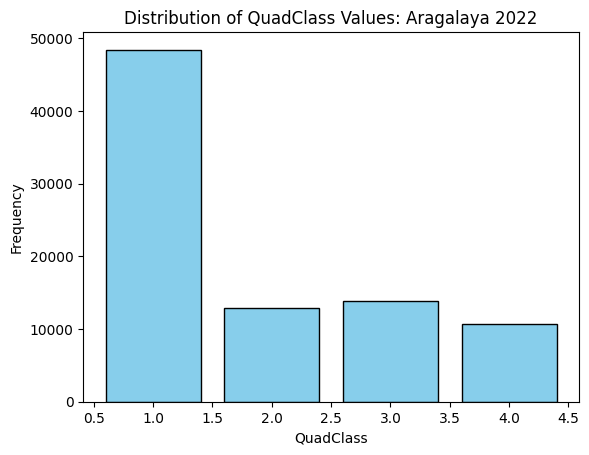

In [0]:
# Plot QuadClass
quadclass_counts = aragalaya["QuadClass"].value_counts()

plt.bar(quadclass_counts.index, quadclass_counts.values, color='skyblue', edgecolor='black')
plt.xlabel('QuadClass')
plt.ylabel('Frequency')
plt.title('Distribution of QuadClass Values: Aragalaya 2022')
plt.show()

#Verbal Cooperation, Material Cooperation, Verbal Conflict, and Material Conflict.

In [0]:
# Explore AvgTone

# Count of AvgTone 26-31 Oct
gdelt_data_full_search["AvgTone"].value_counts()

-4.937362    113
-3.981265     82
-1.822457     76
-4.259635     63
-6.040956     61
            ... 
-7.142857      1
-3.643725      1
-2.191781      1
-0.858369      1
-5.807201      1
Name: AvgTone, Length: 1322, dtype: int64

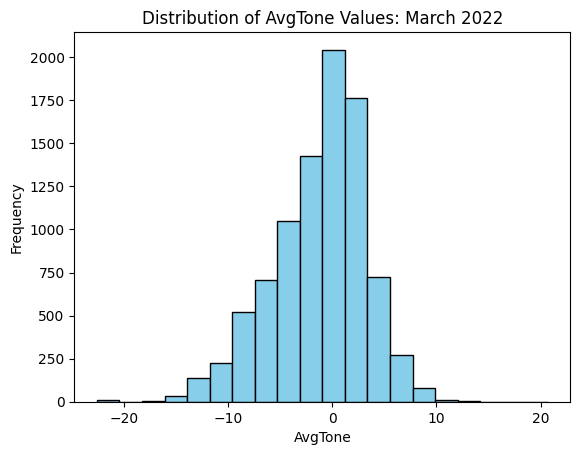

In [0]:
# Plot Avg Tone March 2022
March_data["AvgTone"].plot(kind='hist', bins=20, color='skyblue', edgecolor='black')

plt.xlabel('AvgTone')
plt.ylabel('Frequency')
plt.title('Distribution of AvgTone Values: March 2022')
plt.show()

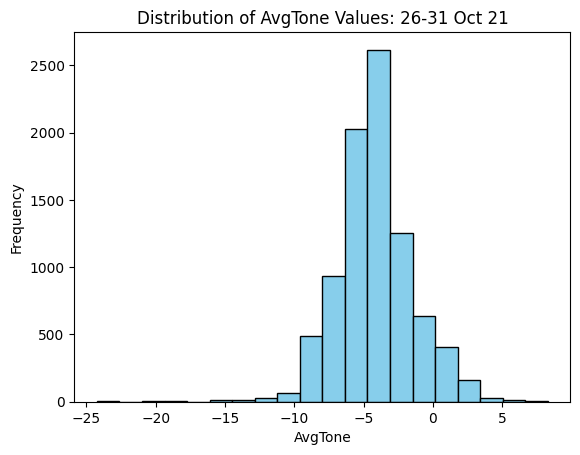

In [0]:
# Plot Avg Tone 26-31 Oct'21
gdelt_data_full_search["AvgTone"].plot(kind='hist', bins=20, color='skyblue', edgecolor='black')

# Adding labels and title
plt.xlabel('AvgTone')
plt.ylabel('Frequency')
plt.title('Distribution of AvgTone Values: 26-31 Oct 21')

# Display the plot
plt.show()

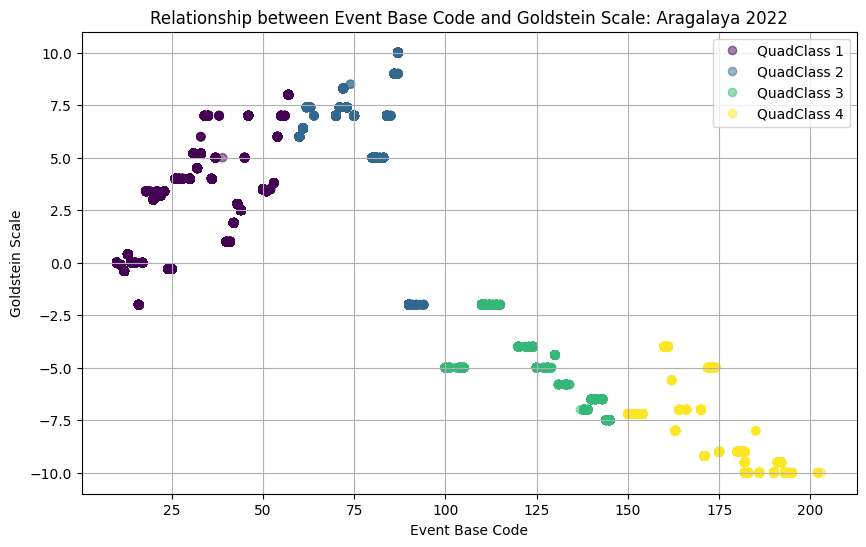

In [0]:
# RELATIONSHIP BETWEEN EVENT CODES AND GOLDSTEIN SCALE: Aragalaya 2022
# Explore relationship between Goldstein Scale and Event Base Code (high + correlation) 

plt.figure(figsize=(10, 6))
scatter = plt.scatter(aragalaya["EventBaseCode"], aragalaya["GoldsteinScale"], c=aragalaya["QuadClass"], cmap='viridis', alpha=0.5)
plt.title("Relationship between Event Base Code and Goldstein Scale: Aragalaya 2022")
plt.xlabel("Event Base Code")
plt.ylabel("Goldstein Scale")
plt.legend(handles=scatter.legend_elements()[0], labels=['QuadClass 1', 'QuadClass 2', 'QuadClass 3', 'QuadClass 4'])
plt.grid(True)
plt.show()


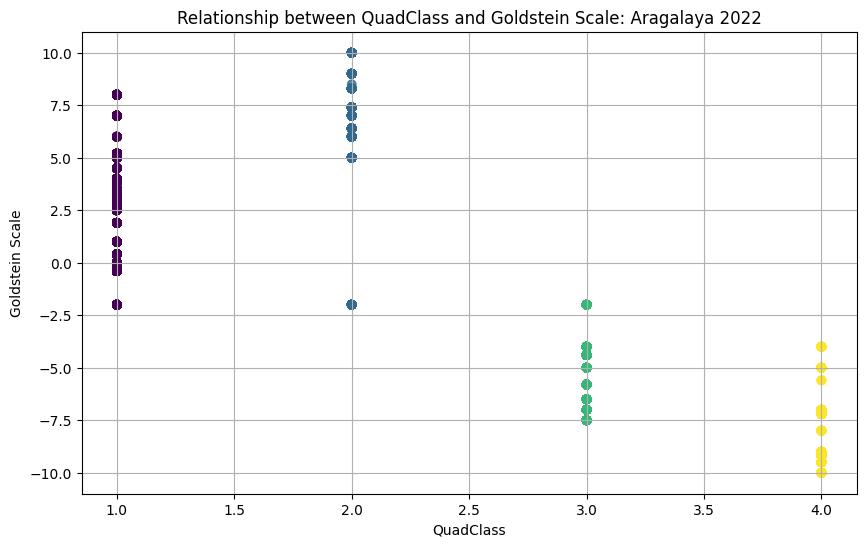

In [0]:
# Explore relationship between Goldstein Scale and QuadClass (high + correlation) - 19-24 Oct 2021

# Scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(aragalaya["QuadClass"], aragalaya["GoldsteinScale"], c=aragalaya["QuadClass"], cmap='viridis', alpha=0.5)

plt.title("Relationship between QuadClass and Goldstein Scale: Aragalaya 2022")
plt.xlabel("QuadClass")
plt.ylabel("Goldstein Scale")
plt.grid(True)
plt.show()

# Verbal and Material Cooperation (QuadClass 1 and 2) have high positive impact
# Verbal and Material Conflict (QuadClass 3 and 4) have high negative impact
# Material Cooperation and Conflict tend to have high positive and high negative impact respectively
# Logically makes sense

# GoldsteinScale 3 or 4 increasing in frequency could indicate a negative impact/crisis looming ? Corr nt Caus!

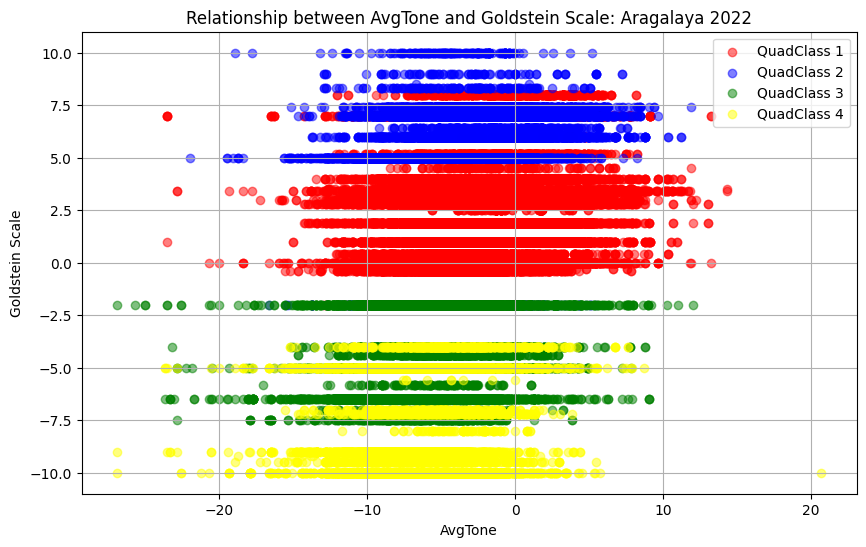

In [0]:
# Create a color dictionary for each QuadClass value
color_dict = {1: 'red', 2: 'blue', 3: 'green', 4: 'yellow'} 

plt.figure(figsize=(10, 6))

# Iterate over each unique QuadClass value and plot points with corresponding color
for quad_class, color in color_dict.items():
    plt.scatter(aragalaya[aragalaya["QuadClass"] == quad_class]["AvgTone"], 
                aragalaya[aragalaya["QuadClass"] == quad_class]["GoldsteinScale"], 
                alpha=0.5, label=f"QuadClass {quad_class}", color=color)

plt.title("Relationship between AvgTone and Goldstein Scale: Aragalaya 2022")
plt.xlabel("AvgTone")
plt.ylabel("Goldstein Scale")
plt.legend()
plt.grid(True)
plt.show()

In [0]:
# NUMSOURCES, NUMARTICLES ANALYSIS

# NumMentions. (integer) This is the total number of mentions of this event across all source documents during the 15 minute update in which it was first seen. Multiple references to an event within a single document also contribute to this count. This can be used as a method of assessing the “importance” of an event 

# NumSources. (integer) This is the total number of information sources containing one or more mentions of this event during the 15 minute update in which it was first seen. This can be used as a method of assessing the “importance” of an event: the more discussion of that event, the more likely it is to be significant. 

# NumArticles. (integer) This is the total number of source documents containing one or more mentions of this event during the 15 minute update in which it was first seen. This can be used as a method of assessing the “importance” of an event: the more discussion of that event, the more likely it is to be significant. 
# 
# Highly correlated 

# Explore counts? If NumMentions and NumSources are increasing, could indicate a crisis?

In [0]:

gdelt_data_full_search["NumMentions"].value_counts()

# ? ? ?

# TIME SERIES?? 

2     392
10    249
1     198
5     174
6     160
4     158
3     128
8     112
7      35
12     15
20     14
18      8
9       8
16      6
40      4
32      3
30      2
24      2
48      2
15      2
13      1
11      1
14      1
17      1
Name: NumMentions, dtype: int64

<Axes: title={'center': 'NumArticles over time'}, xlabel='Date', ylabel='NumArticles'>

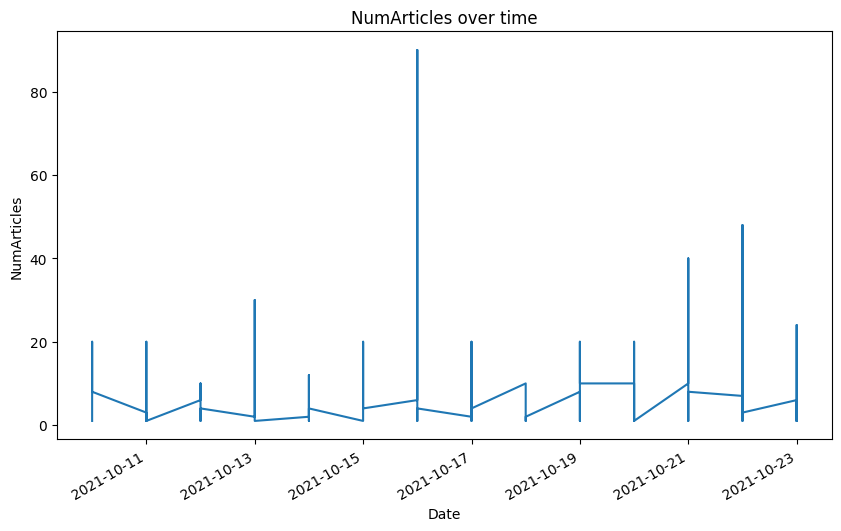

In [0]:
# Plotting the NumArticles over time
preCoup1['NumArticles'].plot(figsize=(10, 6), xlabel='Date', ylabel='NumArticles', title='NumArticles over time')

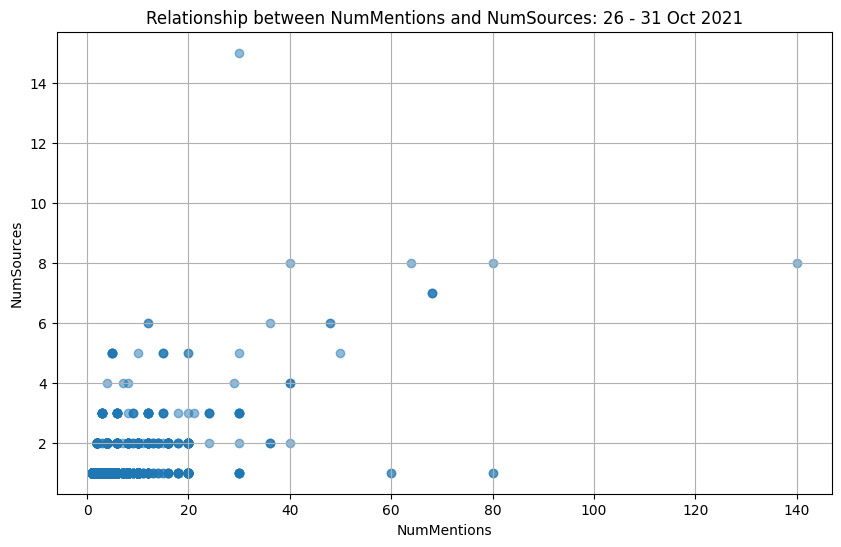

In [0]:
# Relationship between NumMentions and NumSources: 26 - 31 Oct 2021

# Does this pattern apply to EventRootCode?

# Scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(gdelt_data_full_search["NumMentions"], gdelt_data_full_search["NumSources"], alpha=0.5)
plt.title("Relationship between NumMentions and NumSources: 26 - 31 Oct 2021")
plt.xlabel("NumMentions")
plt.ylabel("NumSources")
plt.grid(True)
plt.show()


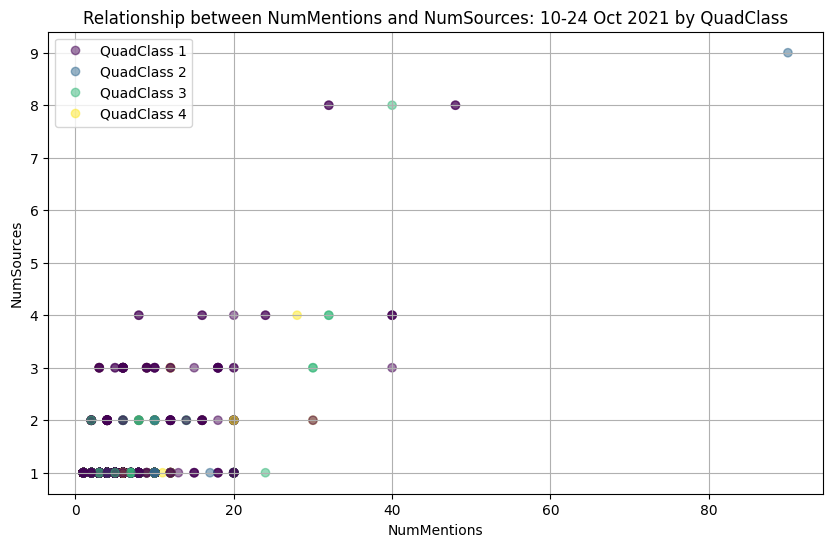

In [0]:
plt.figure(figsize=(10, 6))
scatter = plt.scatter(preCoup["NumMentions"], preCoup["NumSources"], c=preCoup["QuadClass"], cmap='viridis', alpha=0.5)
plt.title("Relationship between NumMentions and NumSources: 10-24 Oct 2021 by QuadClass")
plt.xlabel("NumMentions")
plt.ylabel("NumSources")
plt.legend(handles=scatter.legend_elements()[0], labels=['QuadClass 1', 'QuadClass 2', 'QuadClass 3', 'QuadClass 4'])
plt.grid(True)
plt.show()


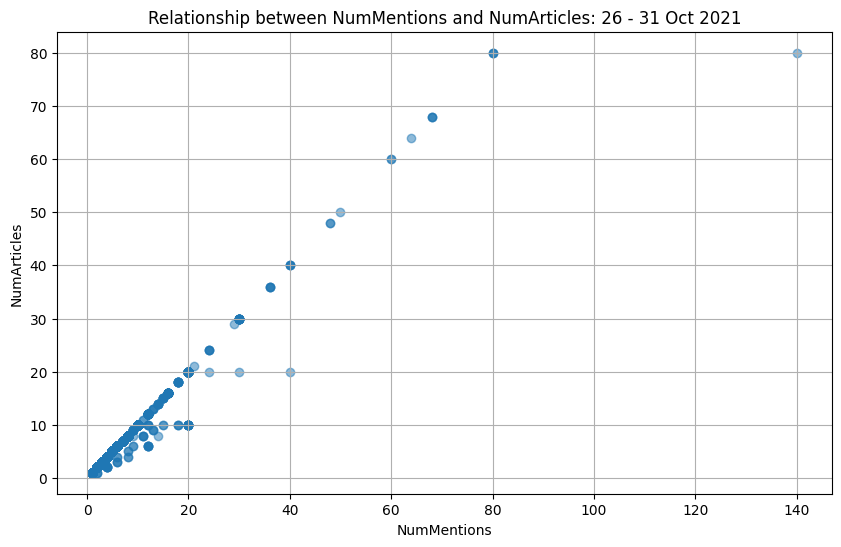

In [0]:
# Relationship between NumMentions and NumArticles: 26 - 31 Oct 2021

# Does this pattern apply to EventRootCode?

# Scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(gdelt_data_full_search["NumMentions"], gdelt_data_full_search["NumArticles"], alpha=0.5)
plt.title("Relationship between NumMentions and NumArticles: 26 - 31 Oct 2021")
plt.xlabel("NumMentions")
plt.ylabel("NumArticles")
plt.grid(True)
plt.show()

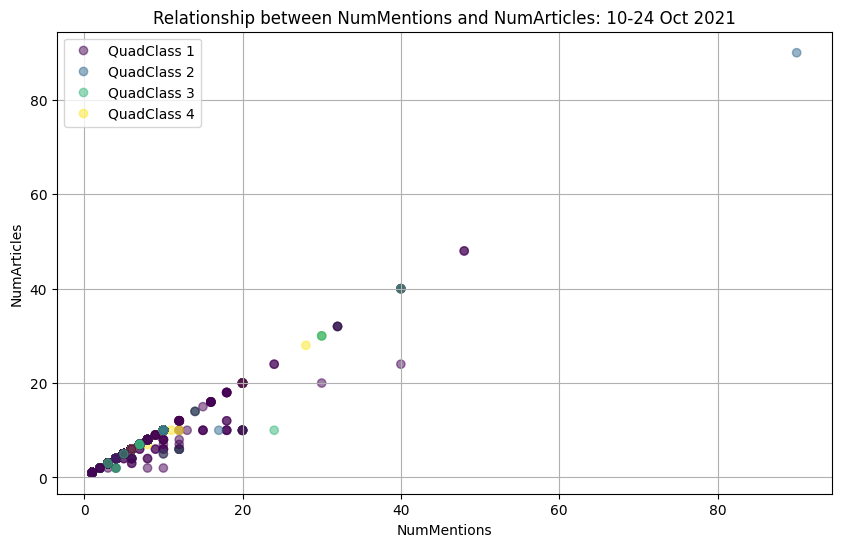

In [0]:
plt.figure(figsize=(10, 6))
scatter = plt.scatter(preCoup["NumMentions"], preCoup["NumArticles"], c=preCoup["QuadClass"], cmap='viridis', alpha=0.5)
plt.title("Relationship between NumMentions and NumArticles: 10-24 Oct 2021")
plt.xlabel("NumMentions")
plt.ylabel("NumArticles")
plt.legend(handles=scatter.legend_elements()[0], labels=['QuadClass 1', 'QuadClass 2', 'QuadClass 3', 'QuadClass 4'])
plt.grid(True)
plt.show()


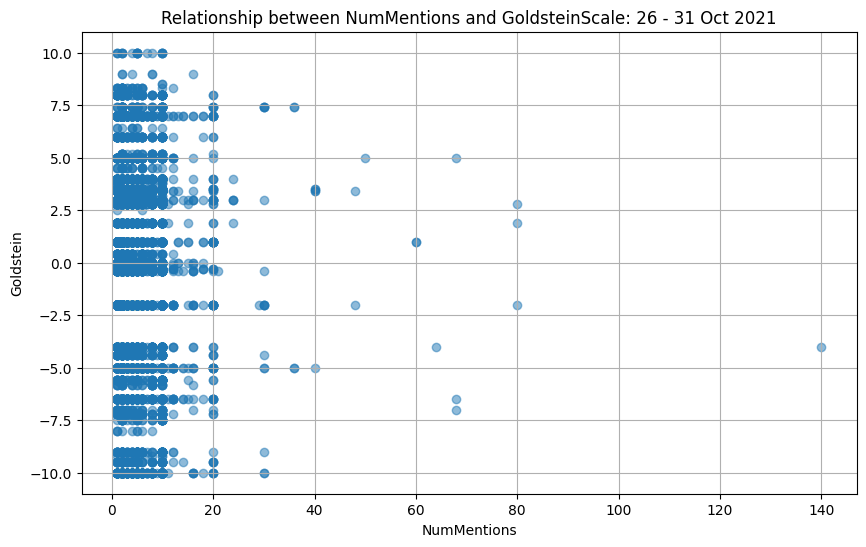

In [0]:
# Relationship between NumMentions and Goldstein: 26 - 31 Oct 2021

# Does this pattern apply to EventRootCode?

# Scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(gdelt_data_full_search["NumMentions"], gdelt_data_full_search["GoldsteinScale"], alpha=0.5)
plt.title("Relationship between NumMentions and GoldsteinScale: 26 - 31 Oct 2021")
plt.xlabel("NumMentions")
plt.ylabel("Goldstein")
plt.grid(True)
plt.show()

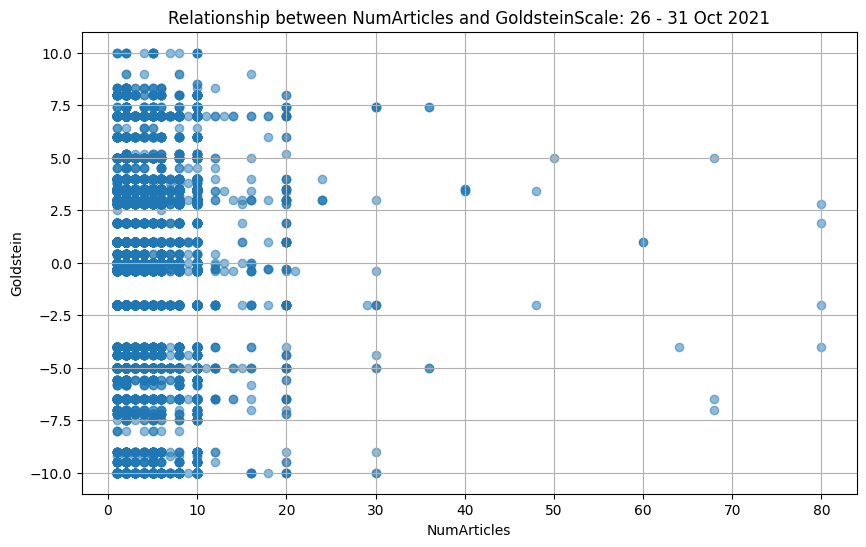

In [0]:
# Relationship between NumArticles and Goldstein: 26 - 31 Oct 2021

# Does this pattern apply to EventRootCode?

# Scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(gdelt_data_full_search["NumArticles"], gdelt_data_full_search["GoldsteinScale"], alpha=0.5)
plt.title("Relationship between NumArticles and GoldsteinScale: 26 - 31 Oct 2021")
plt.xlabel("NumArticles")
plt.ylabel("Goldstein")
plt.grid(True)
plt.show()

In [0]:
preCoup.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4203 entries, 2021-10-10 to 2021-10-23
Data columns (total 57 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   GLOBALEVENTID          4203 non-null   int64  
 1   Actor1Code             3958 non-null   object 
 2   Actor1Name             3958 non-null   object 
 3   Actor1CountryCode      2726 non-null   object 
 4   Actor1KnownGroupCode   86 non-null     object 
 5   Actor1EthnicCode       26 non-null     object 
 6   Actor1Religion1Code    33 non-null     object 
 7   Actor1Religion2Code    10 non-null     object 
 8   Actor1Type1Code        1682 non-null   object 
 9   Actor1Type2Code        132 non-null    object 
 10  Actor1Type3Code        1 non-null      object 
 11  Actor2Code             3577 non-null   object 
 12  Actor2Name             3577 non-null   object 
 13  Actor2CountryCode      2331 non-null   object 
 14  Actor2KnownGroupCode   72 non-null    

In [0]:
preCoup1 = preCoup

<Axes: title={'center': 'QuadClass over time'}, xlabel='Date', ylabel='QuadClass'>

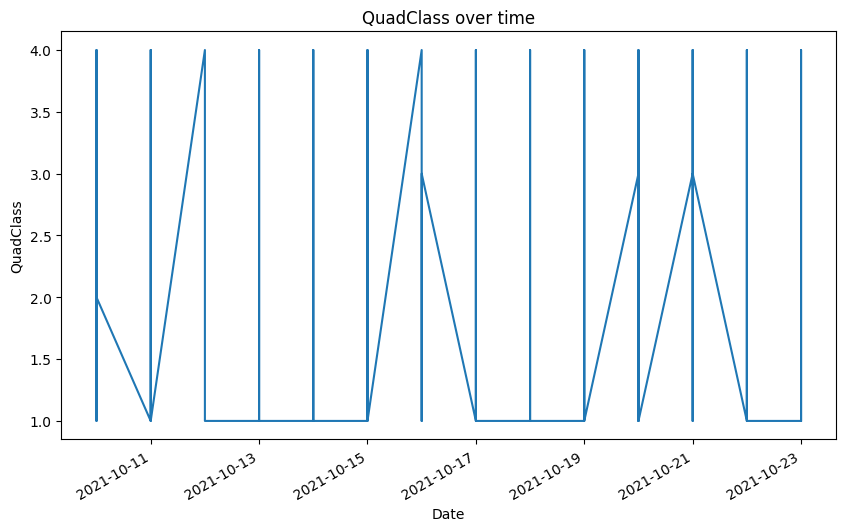

In [0]:
preCoup1.set_index('SQLDATE', inplace=True)  # Set date column as index

# Plotting the QuadClass over time
preCoup1['QuadClass'].plot(figsize=(10, 6), xlabel='Date', ylabel='QuadClass', title='QuadClass over time')


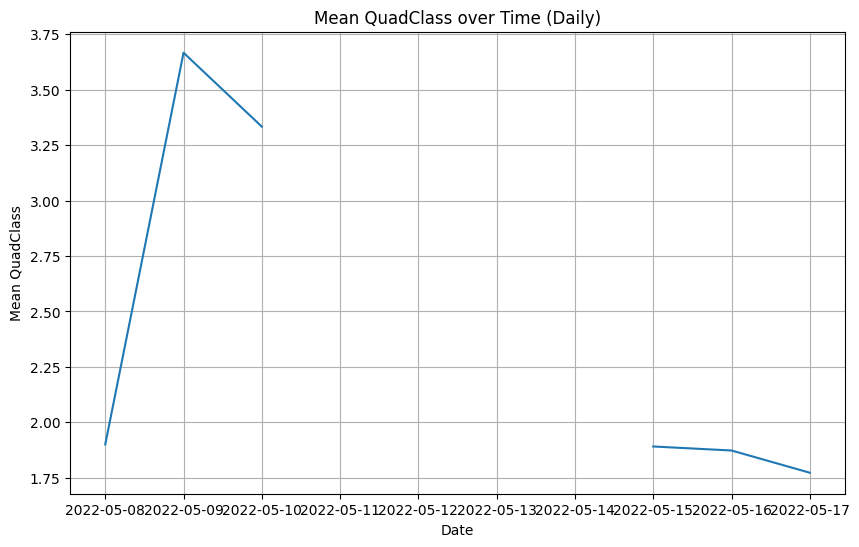

In [0]:
# Not meaningful, so re-calculate by date:

# Group the data into daily intervals and calculate summary statistics for QuadClass within each day
daily_summary = preCoup.groupby(pd.Grouper(key='SQLDATE', freq='D'))['QuadClass'].mean()

# Plot the grouped data
plt.figure(figsize=(10, 6))
plt.plot(daily_summary.index, daily_summary.values)
plt.xlabel('Date')
plt.ylabel('Mean QuadClass')
plt.title('Mean QuadClass over Time (Daily)')
plt.grid(True)
plt.show()

In [0]:
preCoup.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4203 entries, 2021-10-10 to 2021-10-23
Data columns (total 57 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   GLOBALEVENTID          4203 non-null   int64  
 1   Actor1Code             3958 non-null   object 
 2   Actor1Name             3958 non-null   object 
 3   Actor1CountryCode      2726 non-null   object 
 4   Actor1KnownGroupCode   86 non-null     object 
 5   Actor1EthnicCode       26 non-null     object 
 6   Actor1Religion1Code    33 non-null     object 
 7   Actor1Religion2Code    10 non-null     object 
 8   Actor1Type1Code        1682 non-null   object 
 9   Actor1Type2Code        132 non-null    object 
 10  Actor1Type3Code        1 non-null      object 
 11  Actor2Code             3577 non-null   object 
 12  Actor2Name             3577 non-null   object 
 13  Actor2CountryCode      2331 non-null   object 
 14  Actor2KnownGroupCode   72 non-null    

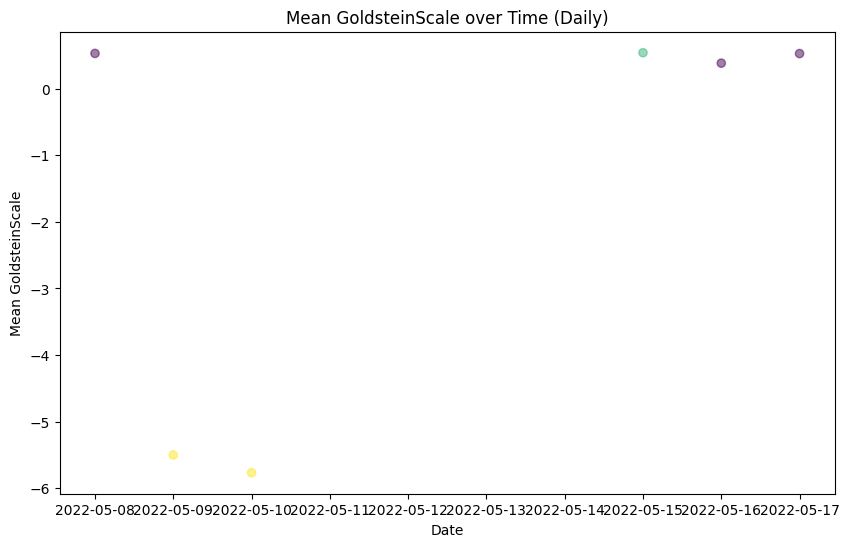

---------------------------------------------------------------------------
ValueError                                Traceback (most recent call last)
File <command-2676439573695273>, line 10
      8 plt.ylabel('Mean GoldsteinScale')
      9 plt.title('Mean GoldsteinScale over Time (Daily)')
---> 10 plt.legend(handles=scatter.legend_elements()[0], labels=['QuadClass 1', 'QuadClass 2', 'QuadClass 3', 'QuadClass 4'])
     11 plt.colorbar(label='QuadClass')
     12 plt.grid(True)

File /databricks/python/lib/python3.10/site-packages/matplotlib/collections.py:1140, in PathCollection.legend_elements(self, prop, num, fmt, func, **kwargs)
   1138 handles.append(h)
   1139 if hasattr(fmt, "set_locs"):
-> 1140     fmt.set_locs(label_values)
   1141 l = fmt(lab)
   1142 labels.append(l)

File /databricks/python/lib/python3.10/site-packages/matplotlib/ticker.py:703, in ScalarFormatter.set_locs(self, locs)
    701     self._compute_offset()
    702 self._set_order_of_magnitude()
--> 703 self._set

In [0]:
# Group the data into daily intervals and calculate summary statistics for GoldsteinScale within each day
daily_summary = preCoup.groupby(pd.Grouper(key='SQLDATE', freq='D')).agg({'GoldsteinScale': 'mean', 'QuadClass': 'first'})

# Plot the grouped data
plt.figure(figsize=(10, 6))
scatter = plt.scatter(daily_summary.index, daily_summary['GoldsteinScale'], c=daily_summary['QuadClass'], cmap='viridis', alpha=0.5)
plt.xlabel('Date')
plt.ylabel('Mean GoldsteinScale')
plt.title('Mean GoldsteinScale over Time (Daily)')
plt.legend(handles=scatter.legend_elements()[0], labels=['QuadClass 1', 'QuadClass 2', 'QuadClass 3', 'QuadClass 4'])
plt.colorbar(label='QuadClass')
plt.grid(True)
plt.show()


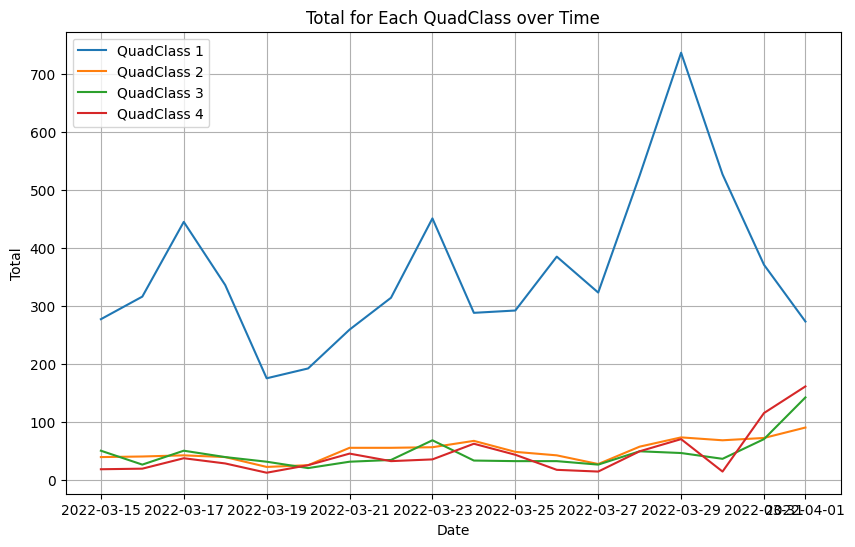

In [0]:
# Group the data by Date and QuadClass, then calculate the total for each QuadClass on each date
quadclass_totals = March_data.groupby(['SQLDATE', 'QuadClass']).size().unstack(fill_value=0)

plt.figure(figsize=(10, 6))
for quad_class in quadclass_totals.columns:
    plt.plot(quadclass_totals.index, quadclass_totals[quad_class], label=f'QuadClass {quad_class}')

plt.xlabel('Date')
plt.ylabel('Total')
plt.title('Total for Each QuadClass over Time')
plt.legend()
plt.grid(True)
plt.show()

# spike in Q1

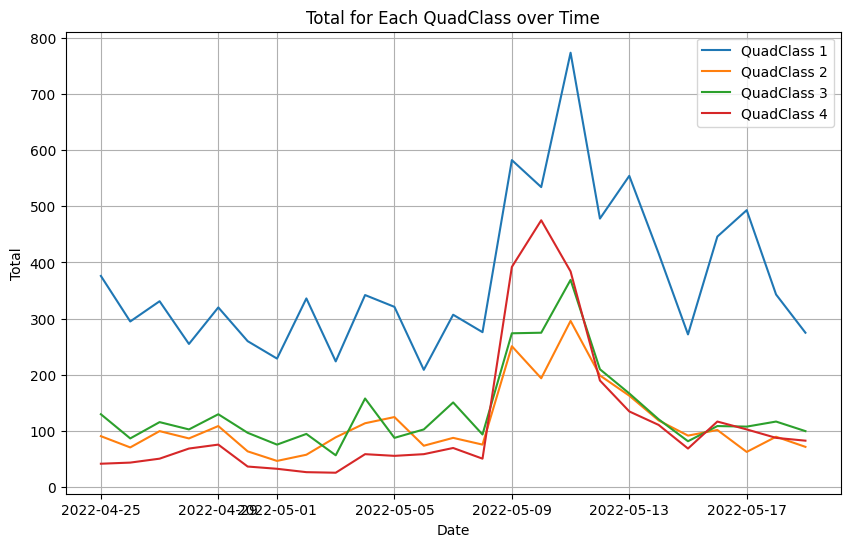

In [0]:
# Group the data by Date and QuadClass, then calculate the total for each QuadClass on each date
quadclass_totals = May_data.groupby(['SQLDATE', 'QuadClass']).size().unstack(fill_value=0)

plt.figure(figsize=(10, 6))
for quad_class in quadclass_totals.columns:
    plt.plot(quadclass_totals.index, quadclass_totals[quad_class], label=f'QuadClass {quad_class}')

plt.xlabel('Date')
plt.ylabel('Total')
plt.title('Total for Each QuadClass over Time')
plt.legend()
plt.grid(True)
plt.show()

# spike in Q1

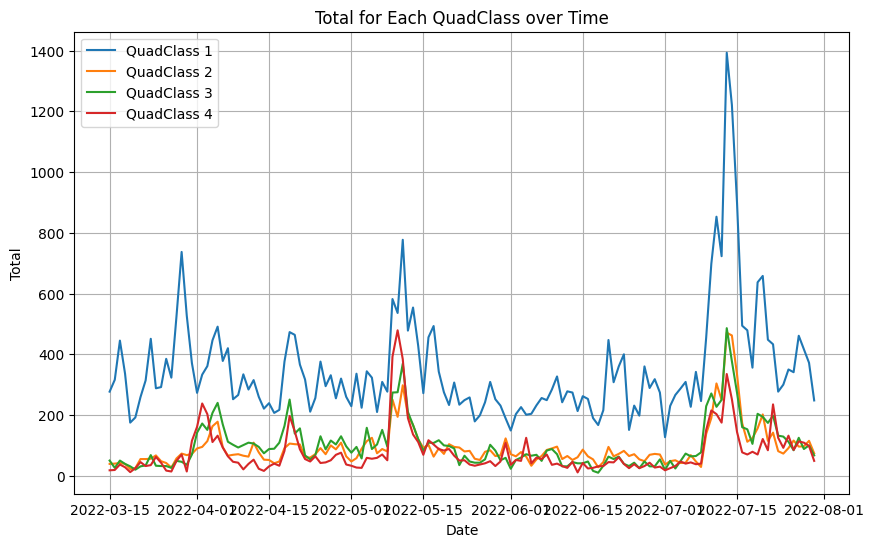

In [0]:
# Group the data by Date and QuadClass, then calculate the total for each QuadClass on each date
quadclass_totals = aragalaya.groupby(['SQLDATE', 'QuadClass']).size().unstack(fill_value=0)

plt.figure(figsize=(10, 6))
for quad_class in quadclass_totals.columns:
    plt.plot(quadclass_totals.index, quadclass_totals[quad_class], label=f'QuadClass {quad_class}')

plt.xlabel('Date')
plt.ylabel('Total')
plt.title('Total for Each QuadClass over Time')
plt.legend()
plt.grid(True)
plt.show()

# spike in Q1
# volume of news increases
# establish baseline of news articles published, and monitor volume of news as a measure

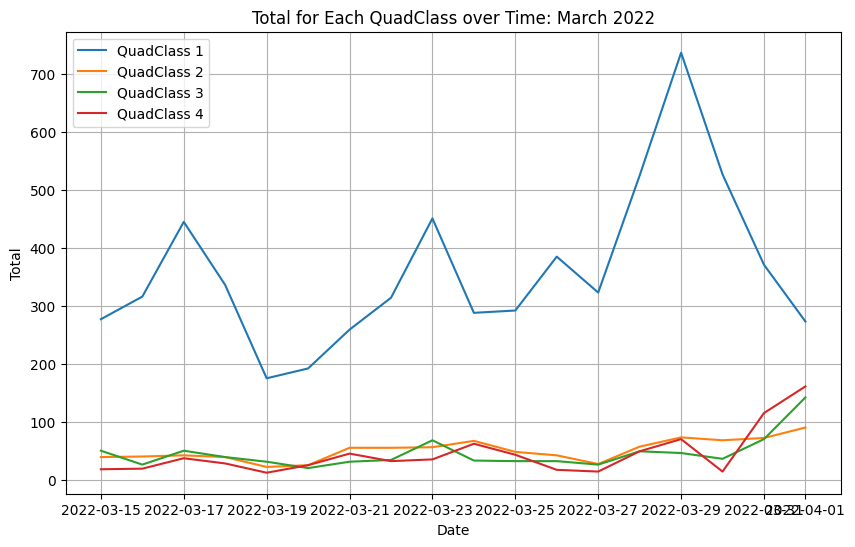

In [0]:
# Group the data by Date and QuadClass, then calculate the total for each QuadClass on each date
quadclass_totals = March_data.groupby(['SQLDATE', 'QuadClass']).size().unstack(fill_value=0)

plt.figure(figsize=(10, 6))
for quad_class in quadclass_totals.columns:
    plt.plot(quadclass_totals.index, quadclass_totals[quad_class], label=f'QuadClass {quad_class}')

plt.xlabel('Date')
plt.ylabel('Total')
plt.title('Total for Each QuadClass over Time: March 2022')
plt.legend()
plt.grid(True)
plt.show()

# spike in Q1
# volume of news increases

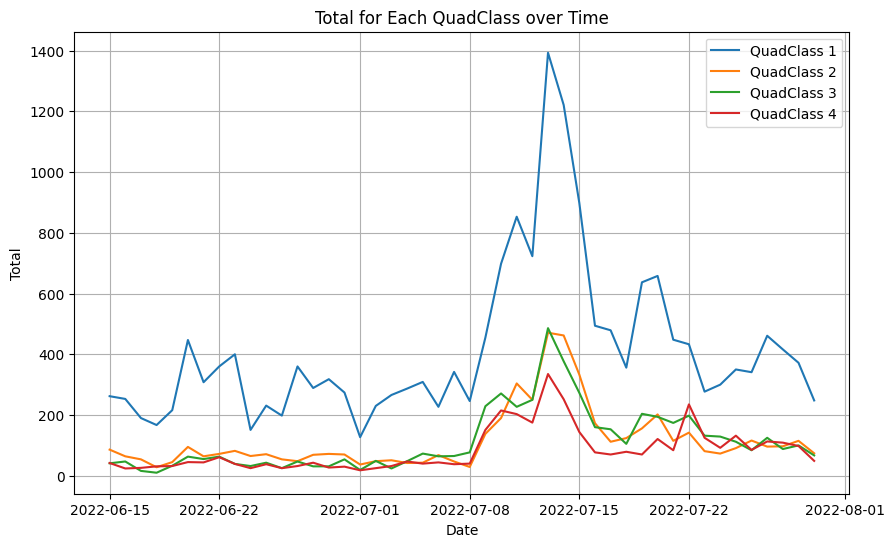

In [0]:
# Group the data by Date and QuadClass, then calculate the total for each QuadClass on each date
quadclass_totals = June_data.groupby(['SQLDATE', 'QuadClass']).size().unstack(fill_value=0)

plt.figure(figsize=(10, 6))
for quad_class in quadclass_totals.columns:
    plt.plot(quadclass_totals.index, quadclass_totals[quad_class], label=f'QuadClass {quad_class}')

plt.xlabel('Date')
plt.ylabel('Total')
plt.title('Total for Each QuadClass over Time')
plt.legend()
plt.grid(True)
plt.show()

# spike in Q1
# volume of news increases

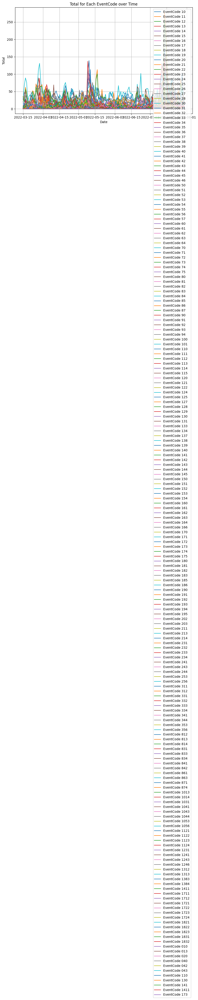

In [0]:
# Group the data by Date and QuadClass, then calculate the total for each QuadClass on each date
quadclass_totals = aragalaya.groupby(['SQLDATE', 'EventCode']).size().unstack(fill_value=0)

plt.figure(figsize=(10, 6))
for quad_class in quadclass_totals.columns:
    plt.plot(quadclass_totals.index, quadclass_totals[quad_class], label=f'EventCode {quad_class}')

plt.xlabel('Date')
plt.ylabel('Total')
plt.title('Total for Each EventCode over Time')
plt.legend()
plt.grid(True)
plt.show()

# spike in Q1
# volume of news increases

In [0]:
#using geopandas to plot events based on type in SL

#creating a new column geometry using point with long and lat
geometry = [Point(xy) for xy in zip(aragalaya['ActionGeo_Long'], aragalaya['ActionGeo_Lat'])]
gdf = gpd.GeoDataFrame(aragalaya, geometry=geometry)
gdf.head(4)

#https://gis.stackexchange.com/questions/404196/create-a-column-geometry-of-points-with-longitude-and-latitude-data-given-in-a
#https://anitagraser.com/2019/01/23/from-csv-to-geodataframe-in-two-lines/
#https://geopandas.org/en/stable/gallery/create_geopandas_from_pandas.html

,GLOBALEVENTID,SQLDATE,Actor1Code,Actor1Name,Actor1CountryCode,Actor1KnownGroupCode,Actor1EthnicCode,Actor1Religion1Code,Actor1Religion2Code,Actor1Type1Code,Actor1Type2Code,Actor1Type3Code,Actor2Code,Actor2Name,Actor2CountryCode,Actor2KnownGroupCode,Actor2EthnicCode,Actor2Religion1Code,Actor2Religion2Code,Actor2Type1Code,Actor2Type2Code,Actor2Type3Code,IsRootEvent,EventCode,EventBaseCode,EventRootCode,QuadClass,GoldsteinScale,NumMentions,NumSources,NumArticles,AvgTone,Actor1Geo_Type,Actor1Geo_FullName,Actor1Geo_CountryCode,Actor1Geo_ADM1Code,Actor1Geo_ADM2Code,Actor1Geo_Lat,Actor1Geo_Long,Actor1Geo_FeatureID,Actor2Geo_Type,Actor2Geo_FullName,Actor2Geo_CountryCode,Actor2Geo_ADM1Code,Actor2Geo_ADM2Code,Actor2Geo_Lat,Actor2Geo_Long,Actor2Geo_FeatureID,ActionGeo_Type,ActionGeo_FullName,ActionGeo_CountryCode,ActionGeo_ADM1Code,ActionGeo_ADM2Code,ActionGeo_Lat,ActionGeo_Long,ActionGeo_FeatureID,DATEADDED,SOURCEURL,geometry
0,1033839347,2022-03-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,COP,DEPUTY,NaN,NaN,NaN,NaN,NaN,COP,NaN,NaN,0,43,43,4,1,2.8,10,1,10,0.389105,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,"Badulla District, Uva, Sri Lanka",CE,CE35,25850,7.00000,81.25,-2213253,4,"Badulla District, Uva, Sri Lanka",CE,CE35,25850,7.00000,81.25,-2213253,20220315000000,https://island.lk/prez-to-address-nation-tomor...,POINT (81.25000 7.00000)
1,1033839367,2022-03-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,EDU,UNIVERSITY,NaN,NaN,NaN,NaN,NaN,EDU,NaN,NaN,0,46,46,4,1,7.0,20,1,20,-1.200659,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,"Ruhuna, Southern, Sri Lanka",CE,CE34,25850,6.51420,81.5423,-2240958,4,"Ruhuna, Southern, Sri Lanka",CE,CE34,25850,6.51420,81.5423,-2240958,20220315000000,https://island.lk/a-crisis-in-social-sciences-...,POINT (81.54230 6.51420)
2,1033839431,2022-03-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,LAB,EMPLOYEE,NaN,NaN,NaN,NaN,NaN,LAB,NaN,NaN,1,57,57,5,1,8.0,33,1,33,1.172569,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,"Colombo, Western, Sri Lanka",CE,CE36,25852,6.93194,79.8478,-2214877,4,"Colombo, Western, Sri Lanka",CE,CE36,25852,6.93194,79.8478,-2214877,20220315000000,https://island.lk/supporting-the-environment-a...,POINT (79.84780 6.93194)
3,1033839572,2022-03-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tam,TAMIL,NaN,NaN,tam,NaN,NaN,NaN,NaN,NaN,0,20,20,2,1,3.0,10,1,10,-1.200659,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,"Ruhuna, Southern, Sri Lanka",CE,CE34,25850,6.51420,81.5423,-2240958,4,"Ruhuna, Southern, Sri Lanka",CE,CE34,25850,6.51420,81.5423,-2240958,20220315000000,https://island.lk/a-crisis-in-social-sciences-...,POINT (81.54230 6.51420)


In [0]:
#define latitude and longitude ranges
min_lat = 5.916
max_lat = 9.842
min_lon = 79.695
max_lon = 81.881

aragalaya['ActionGeo_Long'] = aragalaya['ActionGeo_Long'].astype(float)
aragalaya['ActionGeo_Lat'] = aragalaya['ActionGeo_Lat'].astype(float)

#creating a new column geometry using point with long and lat
geometry = [Point(xy) for xy in zip(aragalaya['ActionGeo_Long'], aragalaya['ActionGeo_Lat'])]
gdf = gpd.GeoDataFrame(aragalaya, geometry=geometry)
gdf.head(4)

#SL shapefile downloaded online
sl = gpd.read_file("places.shp")

sl_news = aragalaya[
    (aragalaya["ActionGeo_Lat"] >= min_lat) & (aragalaya["ActionGeo_Lat"] <= max_lat) &
    (aragalaya["ActionGeo_Long"] >= min_lon) & (aragalaya["ActionGeo_Long"] <= max_lon)
]

#nigeria_news.info()

/root/.ipykernel/1041/command-3141112126066306-383990038:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  aragalaya['ActionGeo_Long'] = aragalaya['ActionGeo_Long'].astype(float)
/root/.ipykernel/1041/command-3141112126066306-383990038:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  aragalaya['ActionGeo_Lat'] = aragalaya['ActionGeo_Lat'].astype(float)


In [0]:
sl_news.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 72013 entries, 0 to 86436
Data columns (total 58 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   GLOBALEVENTID          72013 non-null  int64         
 1   SQLDATE                72013 non-null  datetime64[ns]
 2   Actor1Code             66179 non-null  object        
 3   Actor1Name             66179 non-null  object        
 4   Actor1CountryCode      35509 non-null  object        
 5   Actor1KnownGroupCode   1391 non-null   object        
 6   Actor1EthnicCode       743 non-null    object        
 7   Actor1Religion1Code    655 non-null    object        
 8   Actor1Religion2Code    201 non-null    object        
 9   Actor1Type1Code        38464 non-null  object        
 10  Actor1Type2Code        3615 non-null   object        
 11  Actor1Type3Code        129 non-null    object        
 12  Actor2Code             55081 non-null  object        
 13  A

/root/.ipykernel/1046/command-3141112126066297-3737388520:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  March_data['ActionGeo_Long'] = March_data['ActionGeo_Long'].astype(float)
/root/.ipykernel/1046/command-3141112126066297-3737388520:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  March_data['ActionGeo_Lat'] = March_data['ActionGeo_Lat'].astype(float)


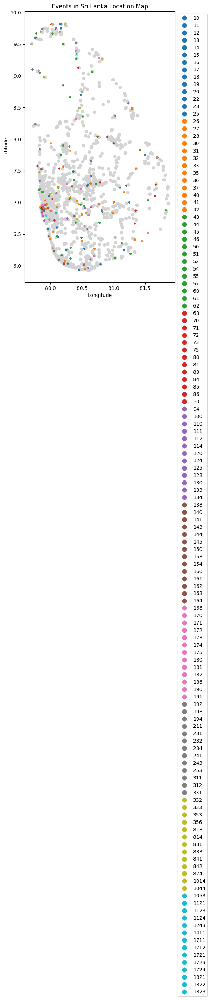

In [0]:
# Define latitude and longitude ranges for Sri Lanka
min_lat = 5.916
max_lat = 9.842
min_lon = 79.695
max_lon = 81.881

# Convert latitude and longitude to float
March_data['ActionGeo_Long'] = March_data['ActionGeo_Long'].astype(float)
March_data['ActionGeo_Lat'] = March_data['ActionGeo_Lat'].astype(float)

# Create geometry column using points from longitude and latitude
geometry = [Point(xy) for xy in zip(March_data['ActionGeo_Long'], March_data['ActionGeo_Lat'])]
gdf = gpd.GeoDataFrame(March_data, geometry=geometry)

# Read the shapefile for Sri Lanka
sl = gpd.read_file("places.shp")

# Filter events within the latitude and longitude ranges of Sri Lanka
sl_news = gdf[
    (gdf["ActionGeo_Lat"] >= min_lat) & (gdf["ActionGeo_Lat"] <= max_lat) &
    (gdf["ActionGeo_Long"] >= min_lon) & (gdf["ActionGeo_Long"] <= max_lon)
]

# Visualize events on the shapefile
fig, ax = plt.subplots(figsize=(15, 10))
sl.plot(ax=ax, color='lightgrey')
sl_news.plot(ax=ax, markersize=10, column='EventCode', legend=True, legend_kwds={'bbox_to_anchor': (1, 1)})
plt.xlabel("Longitude")
plt.ylabel('Latitude')
plt.title('Events in Sri Lanka Location Map')
plt.show()


/root/.ipykernel/1041/command-3141112126066309-1156692816:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  May_data['ActionGeo_Long'] = May_data['ActionGeo_Long'].astype(float)
/root/.ipykernel/1041/command-3141112126066309-1156692816:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  May_data['ActionGeo_Lat'] = May_data['ActionGeo_Lat'].astype(float)


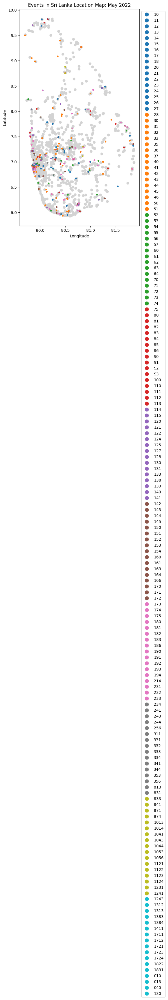

In [0]:
# Convert latitude and longitude to float
May_data['ActionGeo_Long'] = May_data['ActionGeo_Long'].astype(float)
May_data['ActionGeo_Lat'] = May_data['ActionGeo_Lat'].astype(float)

# Create geometry column using points from longitude and latitude
geometry = [Point(xy) for xy in zip(May_data['ActionGeo_Long'], May_data['ActionGeo_Lat'])]
gdf = gpd.GeoDataFrame(May_data, geometry=geometry)

# Read the shapefile for Sri Lanka
sl = gpd.read_file("places.shp")

# Filter events within the latitude and longitude ranges of Sri Lanka
sl_news = gdf[
    (gdf["ActionGeo_Lat"] >= min_lat) & (gdf["ActionGeo_Lat"] <= max_lat) &
    (gdf["ActionGeo_Long"] >= min_lon) & (gdf["ActionGeo_Long"] <= max_lon)
]

# Visualize events on the shapefile
fig, ax = plt.subplots(figsize=(15, 10))
sl.plot(ax=ax, color='lightgrey')
sl_news.plot(ax=ax, markersize=10, column='EventCode', legend=True, legend_kwds={'bbox_to_anchor': (1, 1)})
plt.xlabel("Longitude")
plt.ylabel('Latitude')
plt.title('Events in Sri Lanka Location Map: May 2022')
plt.show()


/root/.ipykernel/1046/command-1443092040336653-346441634:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  May_data['ActionGeo_Long'] = May_data['ActionGeo_Long'].astype(float)
/root/.ipykernel/1046/command-1443092040336653-346441634:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  May_data['ActionGeo_Lat'] = May_data['ActionGeo_Lat'].astype(float)


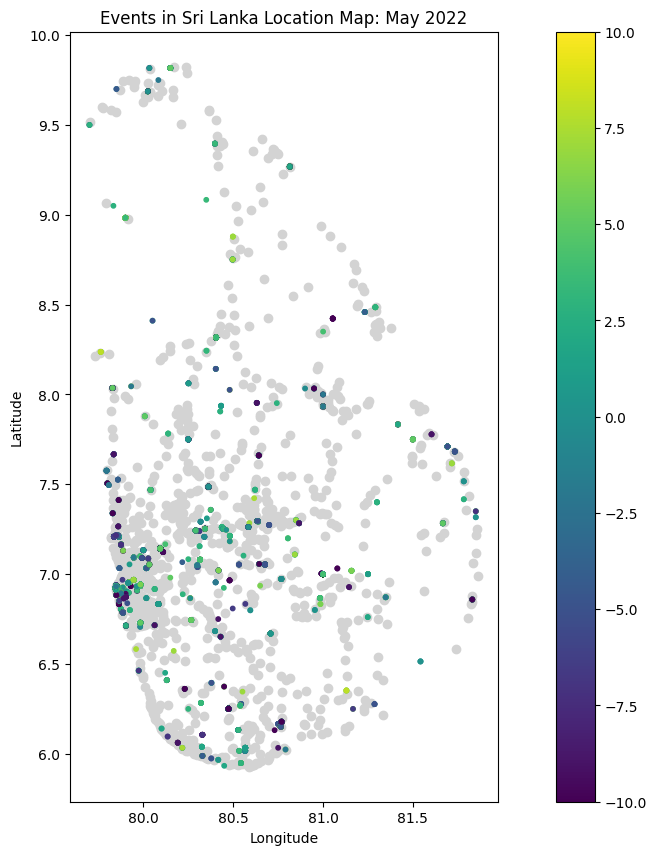

In [0]:
# Convert latitude and longitude to float
May_data['ActionGeo_Long'] = May_data['ActionGeo_Long'].astype(float)
May_data['ActionGeo_Lat'] = May_data['ActionGeo_Lat'].astype(float)

# Create geometry column using points from longitude and latitude
geometry = [Point(xy) for xy in zip(May_data['ActionGeo_Long'], May_data['ActionGeo_Lat'])]
gdf = gpd.GeoDataFrame(May_data, geometry=geometry)

# Read the shapefile for Sri Lanka
sl = gpd.read_file("places.shp")

# Filter events within the latitude and longitude ranges of Sri Lanka
sl_news = gdf[
    (gdf["ActionGeo_Lat"] >= min_lat) & (gdf["ActionGeo_Lat"] <= max_lat) &
    (gdf["ActionGeo_Long"] >= min_lon) & (gdf["ActionGeo_Long"] <= max_lon)
]

# Visualize events on the shapefile
fig, ax = plt.subplots(figsize=(15, 10))
sl.plot(ax=ax, color='lightgrey')
sl_news.plot(ax=ax, markersize=10, column='GoldsteinScale', legend=True)
plt.xlabel("Longitude")
plt.ylabel('Latitude')
plt.title('Events in Sri Lanka Location Map: May 2022')
plt.show()

In [0]:
May_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18399 entries, 23298 to 53198
Data columns (total 58 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   GLOBALEVENTID          18399 non-null  int64         
 1   SQLDATE                18399 non-null  datetime64[ns]
 2   Actor1Code             17009 non-null  object        
 3   Actor1Name             17009 non-null  object        
 4   Actor1CountryCode      8972 non-null   object        
 5   Actor1KnownGroupCode   315 non-null    object        
 6   Actor1EthnicCode       132 non-null    object        
 7   Actor1Religion1Code    217 non-null    object        
 8   Actor1Religion2Code    75 non-null     object        
 9   Actor1Type1Code        9780 non-null   object        
 10  Actor1Type2Code        971 non-null    object        
 11  Actor1Type3Code        12 non-null     object        
 12  Actor2Code             14266 non-null  object        
 1

/root/.ipykernel/1046/command-3141112126066310-2354702069:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  June_data['ActionGeo_Long'] = June_data['ActionGeo_Long'].astype(float)
/root/.ipykernel/1046/command-3141112126066310-2354702069:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  June_data['ActionGeo_Lat'] = June_data['ActionGeo_Lat'].astype(float)


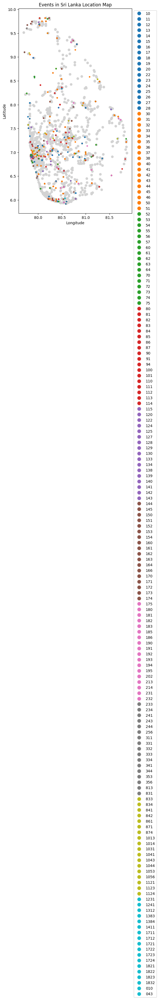

In [0]:
# Convert latitude and longitude to float
June_data['ActionGeo_Long'] = June_data['ActionGeo_Long'].astype(float)
June_data['ActionGeo_Lat'] = June_data['ActionGeo_Lat'].astype(float)

# Create geometry column using points from longitude and latitude
geometry = [Point(xy) for xy in zip(June_data['ActionGeo_Long'], June_data['ActionGeo_Lat'])]
gdf = gpd.GeoDataFrame(June_data, geometry=geometry)

# Read the shapefile for Sri Lanka
sl = gpd.read_file("places.shp")

# Filter events within the latitude and longitude ranges of Sri Lanka
sl_news = gdf[
    (gdf["ActionGeo_Lat"] >= min_lat) & (gdf["ActionGeo_Lat"] <= max_lat) &
    (gdf["ActionGeo_Long"] >= min_lon) & (gdf["ActionGeo_Long"] <= max_lon)
]

# Visualize events on the shapefile
fig, ax = plt.subplots(figsize=(15, 10))
sl.plot(ax=ax, color='lightgrey')
sl_news.plot(ax=ax, markersize=10, column='EventCode', legend=True, legend_kwds={'bbox_to_anchor': (1, 1)})
plt.xlabel("Longitude")
plt.ylabel('Latitude')
plt.title('Events in Sri Lanka Location Map')
plt.show()


/root/.ipykernel/1041/command-3141112126066308-558293737:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  aragalaya['ActionGeo_Long'] = aragalaya['ActionGeo_Long'].astype(float)
/root/.ipykernel/1041/command-3141112126066308-558293737:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  aragalaya['ActionGeo_Lat'] = aragalaya['ActionGeo_Lat'].astype(float)


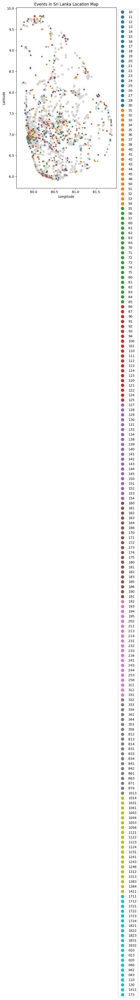

In [0]:
import os
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point

# Define latitude and longitude ranges for Sri Lanka
min_lat = 5.916
max_lat = 9.842
min_lon = 79.695
max_lon = 81.881

# Convert latitude and longitude to float
aragalaya['ActionGeo_Long'] = aragalaya['ActionGeo_Long'].astype(float)
aragalaya['ActionGeo_Lat'] = aragalaya['ActionGeo_Lat'].astype(float)

# Create geometry column using points from longitude and latitude
geometry = [Point(xy) for xy in zip(aragalaya['ActionGeo_Long'], aragalaya['ActionGeo_Lat'])]
gdf = gpd.GeoDataFrame(aragalaya, geometry=geometry)

# Read the shapefile for Sri Lanka
sl = gpd.read_file("places.shp")

# Filter events within the latitude and longitude ranges of Sri Lanka
sl_news = gdf[
    (gdf["ActionGeo_Lat"] >= min_lat) & (gdf["ActionGeo_Lat"] <= max_lat) &
    (gdf["ActionGeo_Long"] >= min_lon) & (gdf["ActionGeo_Long"] <= max_lon)
]

# Visualize events on the shapefile
fig, ax = plt.subplots(figsize=(15, 10))
sl.plot(ax=ax, color='lightgrey')
sl_news.plot(ax=ax, markersize=10, column='EventCode', legend=True, legend_kwds={'bbox_to_anchor': (1, 1)})
plt.xlabel("Longitude")
plt.ylabel('Latitude')
plt.title('Events in Sri Lanka Location Map')
plt.show()


In [0]:
#Jan_data codes
Jan_data["EventCode"].value_counts()

# 42 - make a visit
# 43 - host a visit
# 40 - consult
# 10 - make a statement
# 51 - make an appeal/request

# These are generally high event codes - not specific to a crisis

42     1146
43     1110
40      896
10      709
51      581
       ... 
332       1
312       1
44        1
333       1
862       1
Name: EventCode, Length: 145, dtype: int64

In [0]:
# Common event codes

#March_data codes
March_data["EventCode"].value_counts()

# 40 - consult
# 42 - make a visit
# 43 - host a visit
# 46 - engage in negotiation
# 51 - praise or endorse

# 10, 36, 20, 57, 173

40      1014
42       772
43       707
46       607
51       485
10       480
36       474
20       432
57       230
173      213
60       202
30       184
13       159
190      151
44       132
112      128
141      126
12       113
50       111
71       108
70       106
841       91
14        81
120       72
80        71
111       71
100       69
110       65
90        64
140       63
180       60
17        56
61        55
172       47
130       47
84        45
73        41
33        41
311       40
331       40
160       38
31        36
125       35
175       34
23        34
813       34
26        31
193       30
182       26
1723      26
114       25
150       23
22        23
1411      23
15        21
16        21
192       19
11        18
124       18
874       17
191       17
81        16
154       15
128       14
145       14
41        14
72        13
163       13
62        12
143       12
231       12
27        12
831       11
161       10
232       10
1823       9
32         9

In [0]:
#May_data codes
May_data["EventCode"].value_counts()

# 20 - make an appeal/request
# 10 - make a statement
# 51 - praise or endorse
# 42 - make a visit
# 40 - consult

#43, 831, 46, 190, 60

20      1135
10      1104
51      1027
42       932
40       912
43       873
831      749
46       682
190      617
60       519
141      508
100      416
36       406
120      388
180      377
111      331
173      310
30       297
1411     297
12       296
70       286
112      284
110      282
13       268
193      245
140      240
50       235
71       226
841      207
80       192
175      164
90       162
160      149
172      136
130      134
1724     128
1723     122
73       114
17       113
61       103
14       102
154       98
182       79
57        77
170       76
16        70
241       70
84        70
128       69
1712      66
1041      66
192       65
26        62
33        58
145       57
25        56
143       50
22        48
114       46
72        45
138       42
18        39
32        35
75        33
874       29
813       28
86        28
23        27
153       26
31        26
1822      26
331       25
15        24
41        22
125       22
332       22
11        21

In [0]:
#June_data codes
June_data["EventCode"].value_counts()

# 42 - make a visit
# 40 - consult
# 10 - make a statement
# 43 - host a visit
# 20 - make an appeal/request

# 46, 51, 36, 831, 60

42      2305
40      2134
10      2129
43      2060
20      1854
46      1405
51      1404
36      1324
831     1077
60      1010
80       951
141      823
190      815
173      686
112      666
12       641
13       573
50       564
110      522
120      504
30       502
100      489
111      474
180      422
70       400
57       368
841      331
140      322
71       310
1411     291
130      272
172      268
90       254
73       197
160      195
145      182
175      180
14       172
1724     157
61       148
114      147
171      131
874      117
84       112
1723     108
17       104
26       102
193      100
192       91
22        89
75        88
1712      87
25        85
128       83
16        78
33        75
72        74
133       72
233       72
23        71
32        65
154       65
241       63
44        63
31        61
182       61
138       60
125       59
27        58
813       55
1721      54
186       49
341       47
331       46
170       45
164       44
18        41

In [0]:
#aragalaya codes
aragalaya["EventCode"].value_counts()

# 40 - consult
# 42 - make a visit
# 10 - make a statement
# 20 - make an appeal/request
# 43 - host a visit

#46, 

40      5878
42      5260
10      5210
20      5100
43      4805
51      3955
46      3610
36      3093
60      2562
831     2453
141     2267
190     2216
173     1890
112     1552
80      1525
12      1503
13      1460
120     1446
100     1440
30      1423
110     1299
50      1256
111     1233
70      1162
71      1061
180     1052
140     1004
841      932
1411     924
57       916
90       723
130      685
172      635
175      625
193      595
160      578
73       538
14       511
61       495
1724     368
1723     355
84       351
17       333
145      320
114      312
33       256
26       251
192      248
182      246
22       244
23       241
128      230
154      223
25       221
241      221
16       220
44       208
874      193
1712     171
311      170
331      168
72       162
125      155
31       150
32       148
170      145
813      144
75       142
161      139
171      138
41       137
15       137
81       129
1041     129
138      127
133      125
18       123

In [0]:
#plot only top event codes - 20, 10, 40, 42, 43, 46, 51

event_codes = [20, 10, 40, 42, 43, 46, 51]
event_codes_df = aragalaya[aragalaya['EventCode'].isin(event_codes)]

plt.figure(figsize=(10, 6))
sns.countplot(data=event_codes_df, x='EventCode')
plt.title('Distribution of Top Event Codes')
plt.xlabel('Event Code')
plt.ylabel('Count')
plt.show()


<Figure size 1000x600 with 0 Axes>

---------------------------------------------------------------------------
ValueError                                Traceback (most recent call last)
File <command-1929783340378891>, line 7
      4 event_codes_df = aragalaya[aragalaya['EventCode'].isin(event_codes)]
      6 plt.figure(figsize=(10, 6))
----> 7 sns.countplot(data=event_codes_df, x='EventCode')
      8 plt.title('Distribution of Top Event Codes')
      9 plt.xlabel('Event Code')

File /databricks/python/lib/python3.10/site-packages/seaborn/categorical.py:2943, in countplot(data, x, y, hue, order, hue_order, orient, color, palette, saturation, width, dodge, ax, **kwargs)
   2940 elif x is not None and y is not None:
   2941     raise ValueError("Cannot pass values for both `x` and `y`")
-> 2943 plotter = _CountPlotter(
   2944     x, y, hue, data, order, hue_order,
   2945     estimator, errorbar, n_boot, units, seed,
   2946     orient, color, palette, saturation,
   2947     width, errcolor, errwidth, capsize, dodge
  

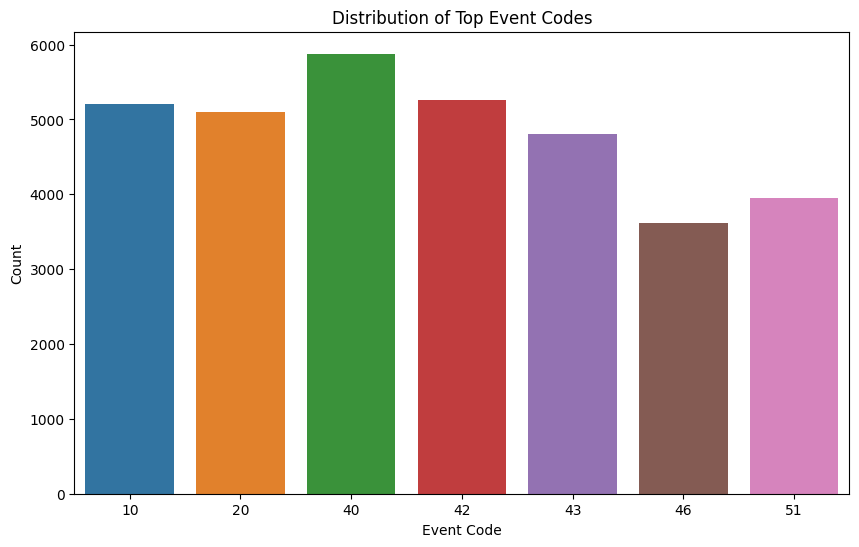

In [0]:
#plot only top event codes - 20, 10, 40, 42, 43, 46, 51

event_codes = [20, 10, 40, 42, 43, 46, 51]
event_codes_df = aragalaya[aragalaya['EventCode'].isin(event_codes)]

plt.figure(figsize=(10, 6))
sns.countplot(data=event_codes_df, x='EventCode')
plt.title('Distribution of Top Event Codes')
plt.xlabel('Event Code')
plt.ylabel('Count')
plt.show()


/root/.ipykernel/1127/command-1101675968538453-1912117949:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  aragalaya['SQLDATE'] = pd.to_datetime(aragalaya['SQLDATE'])


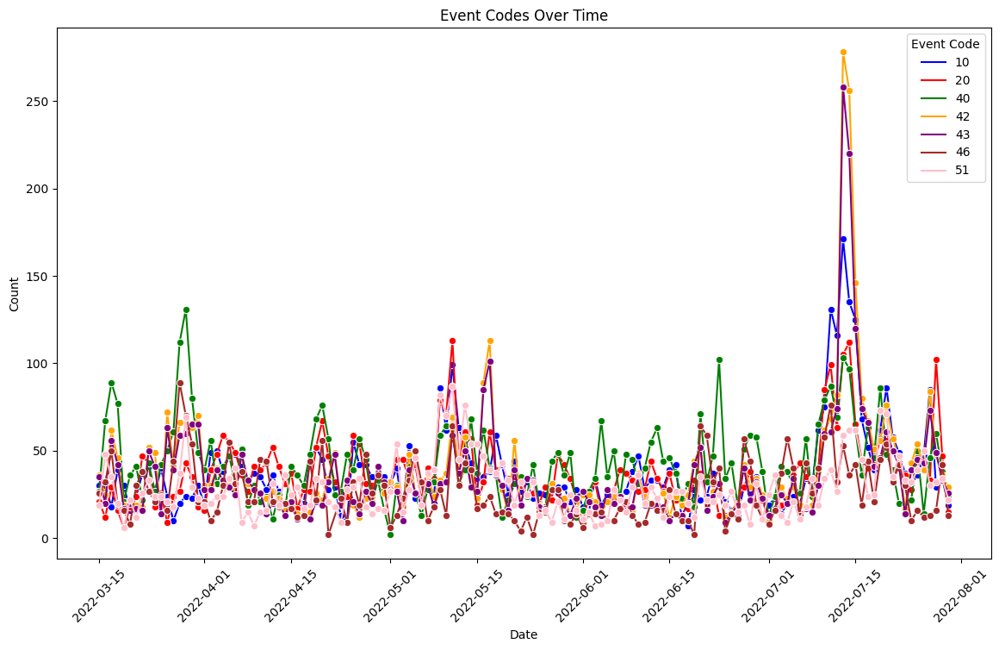

In [0]:
# Convert the 'date' column to datetime
aragalaya['SQLDATE'] = pd.to_datetime(aragalaya['SQLDATE'])

# Define the list of event codes to filter
event_codes = [20, 10, 40, 42, 43, 46, 51]

custom_palette = {
    20: 'red',
    10: 'blue',
    40: 'green',
    42: 'orange',
    43: 'purple',
    46: 'brown',
    51: 'pink'
}

# Filter the DataFrame
filtered_df = aragalaya[aragalaya['EventCode'].isin(event_codes)]

# Group by date and event code to get the count of each event per day
grouped_df = filtered_df.groupby(['SQLDATE', 'EventCode']).size().reset_index(name='count')

# Plot the trend of event codes over time
plt.figure(figsize=(14, 8))
sns.lineplot(data=grouped_df, x='SQLDATE', y='count', hue='EventCode', palette=custom_palette, marker='o')

plt.title('Event Codes Over Time')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Event Code')
plt.show()

# 9 May 2022 - general violence (peaceful protests turned violent)
# 15 May 2022 - reconvening of P'ment for the first time after 9 May violence

/root/.ipykernel/1124/command-1112189770142360-3430058523:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Jan_data['SQLDATE'] = pd.to_datetime(Jan_data['SQLDATE'])


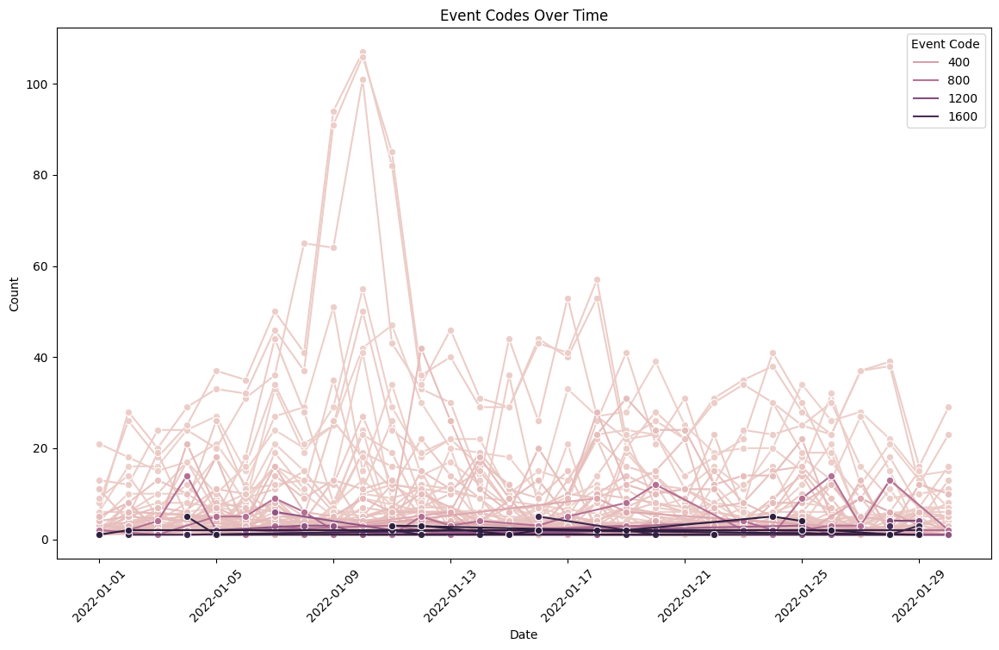

In [0]:
# See how all event codes perform in Jan_data
Jan_data['SQLDATE'] = pd.to_datetime(Jan_data['SQLDATE'])

custom_palette = {
    20: 'red',
    10: 'blue',
    40: 'green',
    42: 'orange',
    43: 'purple',
    46: 'brown',
    51: 'pink'
}

# Filter the DataFrame
#filtered_df = Jan_data[Jan_data['EventCode'].isin(event_codes)]

# Group by date and event code to get the count of each event per day
grouped_df = Jan_data.groupby(['SQLDATE', 'EventCode']).size().reset_index(name='count')

# Plot the trend of event codes over time
plt.figure(figsize=(14, 8))
sns.lineplot(data=grouped_df, x='SQLDATE', y='count', hue='EventCode', marker='o')

plt.title('Event Codes Over Time')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Event Code')
plt.show()

# what is this spike above 100 around 9 Jan?

In [0]:
#look at news articles on 9 and 10 Jan 2022

dates = [20220109, 20220110]

dates = [pd.to_datetime(str(date), format='%Y%m%d') for date in dates]

filtered_df = Jan_data[Jan_data['SQLDATE'].isin(dates)]
filtered_df.head(3)

,GLOBALEVENTID,SQLDATE,Actor1Code,Actor1Name,Actor1CountryCode,Actor1KnownGroupCode,Actor1EthnicCode,Actor1Religion1Code,Actor1Religion2Code,Actor1Type1Code,Actor1Type2Code,Actor1Type3Code,Actor2Code,Actor2Name,Actor2CountryCode,Actor2KnownGroupCode,Actor2EthnicCode,Actor2Religion1Code,Actor2Religion2Code,Actor2Type1Code,Actor2Type2Code,Actor2Type3Code,IsRootEvent,EventCode,EventBaseCode,EventRootCode,QuadClass,GoldsteinScale,NumMentions,NumSources,NumArticles,AvgTone,Actor1Geo_Type,Actor1Geo_FullName,Actor1Geo_CountryCode,Actor1Geo_ADM1Code,Actor1Geo_ADM2Code,Actor1Geo_Lat,Actor1Geo_Long,Actor1Geo_FeatureID,Actor2Geo_Type,Actor2Geo_FullName,Actor2Geo_CountryCode,Actor2Geo_ADM1Code,Actor2Geo_ADM2Code,Actor2Geo_Lat,Actor2Geo_Long,Actor2Geo_FeatureID,ActionGeo_Type,ActionGeo_FullName,ActionGeo_CountryCode,ActionGeo_ADM1Code,ActionGeo_ADM2Code,ActionGeo_Lat,ActionGeo_Long,ActionGeo_FeatureID,DATEADDED,SOURCEURL
2720,1022408868,2022-01-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CVL,COMMUNITY,NaN,NaN,NaN,NaN,NaN,CVL,NaN,NaN,1,40,40,4,1,1.0,10,1,10,-3.726708,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,"Colombo, Western, Sri Lanka",CE,CE36,25852,6.93194,79.8478,-2214877,4,"Colombo, Western, Sri Lanka",CE,CE36,25852,6.93194,79.8478,-2214877,20220109003000,https://island.lk/sri-lanka-institute-of-taxat...
2721,1022409018,2022-01-09,BUD,BUDDHIST,NaN,NaN,NaN,BUD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,190,190,19,4,-10.0,3,1,3,-3.532137,4,"Colombo, Western, Sri Lanka",CE,CE36,25852,6.93194,79.8478,-2214877,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,"Colombo, Western, Sri Lanka",CE,CE36,25852,6.93194,79.8478,-2214877,20220109003000,https://island.lk/jvp-npp-manifesto-sparks-a-s...
2722,1022409055,2022-01-09,CHN,CHINA,CHN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,112,112,11,3,-2.0,8,1,8,0.312500,4,"Kilinochchi, Northern, Sri Lanka",CE,CE38,25842,9.39610,80.3982,-2223503,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,"Kilinochchi, Northern, Sri Lanka",CE,CE38,25842,9.39610,80.3982,-2223503,20220109003000,https://island.lk/northern-fishermen-switch-to...


/root/.ipykernel/1051/command-2412452638481942-2570932928:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Jan_data['SQLDATE'] = pd.to_datetime(Jan_data['SQLDATE'])


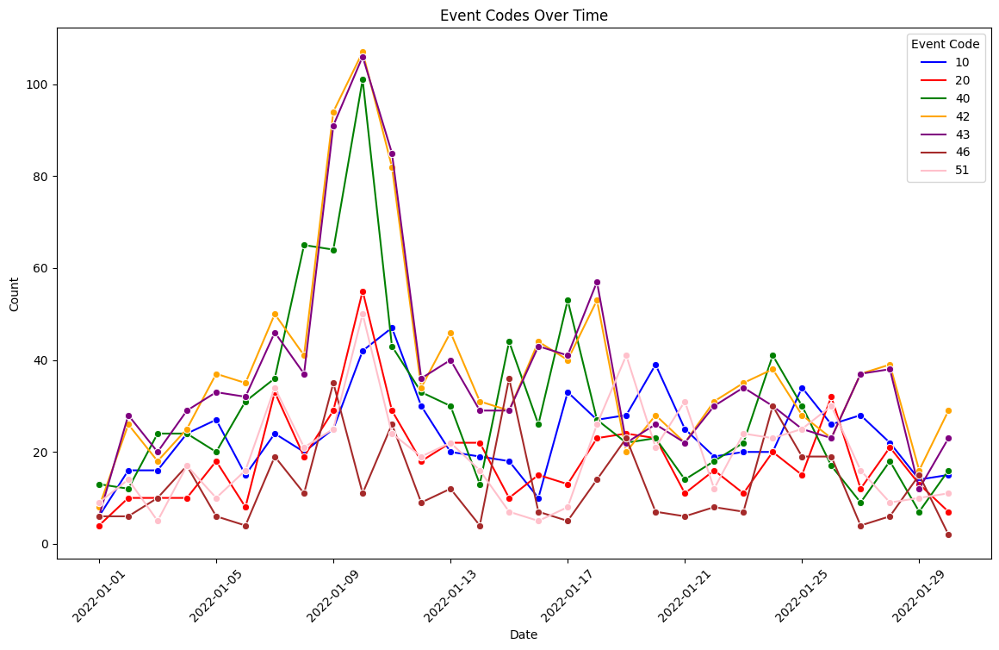

In [0]:
# Convert the 'date' column to datetime
Jan_data['SQLDATE'] = pd.to_datetime(Jan_data['SQLDATE'])

# Define the list of event codes to filter
event_codes = [20, 10, 40, 42, 43, 46, 51]

custom_palette = {
    20: 'red',
    10: 'blue',
    40: 'green',
    42: 'orange',
    43: 'purple',
    46: 'brown',
    51: 'pink'
}

# Filter the DataFrame
#filtered_df = Jan_data[Jan_data['EventCode'].isin(event_codes)]

# Group by date and event code to get the count of each event per day
grouped_df = filtered_df.groupby(['SQLDATE', 'EventCode']).size().reset_index(name='count')

# Plot the trend of event codes over time
plt.figure(figsize=(14, 8))
sns.lineplot(data=grouped_df, x='SQLDATE', y='count', hue='EventCode', palette=custom_palette, marker='o')

plt.title('Event Codes Over Time')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Event Code')
plt.show()

In [0]:
#explore the spike in Jan 2022

# see counts of actors? see if there is a change
# see counts of events? see if there is a change
# counts of QuadClass?
# what about AvgTone?

In [0]:
# Convert the 'SQLDATE' column to datetime
Jan_data['SQLDATE'] = pd.to_datetime(Jan_data['SQLDATE'])

# Filter rows with dates between '09/01/2022' and '13/01/2022'
Jan_data2 = Jan_data.loc[(Jan_data['SQLDATE'] >= '2022-01-09') & (Jan_data['SQLDATE'] <= '2022-01-13')]

Jan_data2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2860 entries, 2720 to 7276
Data columns (total 58 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   GLOBALEVENTID          2860 non-null   int64         
 1   SQLDATE                2860 non-null   datetime64[ns]
 2   Actor1Code             2669 non-null   object        
 3   Actor1Name             2669 non-null   object        
 4   Actor1CountryCode      1915 non-null   object        
 5   Actor1KnownGroupCode   15 non-null     object        
 6   Actor1EthnicCode       26 non-null     object        
 7   Actor1Religion1Code    3 non-null      object        
 8   Actor1Religion2Code    0 non-null      object        
 9   Actor1Type1Code        1142 non-null   object        
 10  Actor1Type2Code        67 non-null     object        
 11  Actor1Type3Code        0 non-null      object        
 12  Actor2Code             2386 non-null   object        
 13  

/root/.ipykernel/11505/command-4035149564586757-2419429399:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Jan_data['SQLDATE'] = pd.to_datetime(Jan_data['SQLDATE'])


In [0]:
pd.set_option('display.max_rows', None)
Jan_data.EventCode.value_counts()

42      1146
43      1110
40       896
10       709
51       581
20       553
36       472
46       384
173      368
57       305
60       260
190      256
120      235
61       234
71       234
30       223
112      202
90       185
111      150
17       146
13       139
50       138
100      125
12       125
80       120
841      116
70       111
110      108
84       105
172      100
130       95
160       57
114       54
14        50
311       50
193       48
141       41
831       40
26        38
81        38
62        38
73        38
54        35
31        32
23        32
33        31
180       30
18        28
182       26
16        26
192       25
125       24
163       24
15        20
72        20
331       19
25        18
874       18
1822      16
1124      15
32        15
127       14
41        14
22        13
1123      13
186       12
52        12
140       12
1831      11
45        11
842       11
150       10
253       10
233       10
1711      10
138       10
37        10

In [0]:
for i in Jan_data2['SOURCEURL']:
    print(i)

# spike potentially explained by increased Chinese presence - Chinese FM in SL on 8/9 Jan 2022
# due to CHinese presence in SL, some agitation from India as well
# there was also a highly contested sovereign debt payment around this time.

https://island.lk/sri-lanka-institute-of-taxation-gets-new-council/
https://island.lk/jvp-npp-manifesto-sparks-a-season-of-debates/
https://island.lk/northern-fishermen-switch-to-china-backed-sea-cucumber-boom/
https://island.lk/northern-fishermen-switch-to-china-backed-sea-cucumber-boom/
https://island.lk/sri-lanka-institute-of-taxation-gets-new-council/
https://island.lk/sri-lanka-institute-of-taxation-gets-new-council/
https://island.lk/sir-ponnambalam-arunachalam-1853-1924/
https://island.lk/sir-ponnambalam-arunachalam-1853-1924/
https://island.lk/sir-ponnambalam-arunachalam-1853-1924/
https://island.lk/sir-ponnambalam-arunachalam-1853-1924/
https://island.lk/former-dghs-dr-jasinghe-insists-on-not-lowering-our-guard-till-covid-19-is-eradicated/
https://island.lk/sir-ponnambalam-arunachalam-1853-1924/
https://island.lk/sri-lanka-institute-of-taxation-gets-new-council/
https://island.lk/sir-ponnambalam-arunachalam-1853-1924/
https://island.lk/sir-ponnambalam-arunachalam-1853-1924/
ht

In [0]:
aragalaya.head(10)

,GLOBALEVENTID,SQLDATE,Actor1Code,Actor1Name,Actor1CountryCode,Actor1KnownGroupCode,Actor1EthnicCode,Actor1Religion1Code,Actor1Religion2Code,Actor1Type1Code,Actor1Type2Code,Actor1Type3Code,Actor2Code,Actor2Name,Actor2CountryCode,Actor2KnownGroupCode,Actor2EthnicCode,Actor2Religion1Code,Actor2Religion2Code,Actor2Type1Code,Actor2Type2Code,Actor2Type3Code,IsRootEvent,EventCode,EventBaseCode,EventRootCode,QuadClass,GoldsteinScale,NumMentions,NumSources,NumArticles,AvgTone,Actor1Geo_Type,Actor1Geo_FullName,Actor1Geo_CountryCode,Actor1Geo_ADM1Code,Actor1Geo_ADM2Code,Actor1Geo_Lat,Actor1Geo_Long,Actor1Geo_FeatureID,Actor2Geo_Type,Actor2Geo_FullName,Actor2Geo_CountryCode,Actor2Geo_ADM1Code,Actor2Geo_ADM2Code,Actor2Geo_Lat,Actor2Geo_Long,Actor2Geo_FeatureID,ActionGeo_Type,ActionGeo_FullName,ActionGeo_CountryCode,ActionGeo_ADM1Code,ActionGeo_ADM2Code,ActionGeo_Lat,ActionGeo_Long,ActionGeo_FeatureID,DATEADDED,SOURCEURL
0,1033839347,2022-03-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,COP,DEPUTY,NaN,NaN,NaN,NaN,NaN,COP,NaN,NaN,0,43,43,4,1,2.8,10,1,10,0.389105,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,"Badulla District, Uva, Sri Lanka",CE,CE35,25850,7.00000,81.25,-2213253,4,"Badulla District, Uva, Sri Lanka",CE,CE35,25850,7.00000,81.25,-2213253,20220315000000,https://island.lk/prez-to-address-nation-tomor...
1,1033839367,2022-03-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,EDU,UNIVERSITY,NaN,NaN,NaN,NaN,NaN,EDU,NaN,NaN,0,46,46,4,1,7.0,20,1,20,-1.200659,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,"Ruhuna, Southern, Sri Lanka",CE,CE34,25850,6.51420,81.5423,-2240958,4,"Ruhuna, Southern, Sri Lanka",CE,CE34,25850,6.51420,81.5423,-2240958,20220315000000,https://island.lk/a-crisis-in-social-sciences-...
2,1033839431,2022-03-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,LAB,EMPLOYEE,NaN,NaN,NaN,NaN,NaN,LAB,NaN,NaN,1,57,57,5,1,8.0,33,1,33,1.172569,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,"Colombo, Western, Sri Lanka",CE,CE36,25852,6.93194,79.8478,-2214877,4,"Colombo, Western, Sri Lanka",CE,CE36,25852,6.93194,79.8478,-2214877,20220315000000,https://island.lk/supporting-the-environment-a...
3,1033839572,2022-03-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tam,TAMIL,NaN,NaN,tam,NaN,NaN,NaN,NaN,NaN,0,20,20,2,1,3.0,10,1,10,-1.200659,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,"Ruhuna, Southern, Sri Lanka",CE,CE34,25850,6.51420,81.5423,-2240958,4,"Ruhuna, Southern, Sri Lanka",CE,CE34,25850,6.51420,81.5423,-2240958,20220315000000,https://island.lk/a-crisis-in-social-sciences-...
4,1033839573,2022-03-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tam,TAMIL,NaN,NaN,tam,NaN,NaN,NaN,NaN,NaN,0,52,52,5,1,3.5,10,1,10,-1.200659,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,"Ruhuna, Southern, Sri Lanka",CE,CE34,25850,6.51420,81.5423,-2240958,4,"Ruhuna, Southern, Sri Lanka",CE,CE34,25850,6.51420,81.5423,-2240958,20220315000000,https://island.lk/a-crisis-in-social-sciences-...
5,1033839699,2022-03-15,BUS,COMPANY,NaN,NaN,NaN,NaN,NaN,BUS,NaN,NaN,LKA,SRI LANKAN,LKA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,111,111,11,3,-2.0,110,1,110,1.172569,4,"Colombo, Western, Sri Lanka",CE,CE36,25852,6.93194,79.8478,-2214877,4,"Colombo, Western, Sri Lanka",CE,CE36,25852,6.93194,79.8478,-2214877,4,"Colombo, Western, Sri Lanka",CE,CE36,25852,6.93194,79.8478,-2214877,20220315000000,https://island.lk/supporting-the-environment-a...
6,1033839860,2022-03-15,COP,DEPUTY,NaN,NaN,NaN,NaN,NaN,COP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,42,42,4,1,1.9,10,1,10,0.389105,4,"Badulla District, Uva, Sri Lanka",CE,CE35,25850,7.00000,81.25,-2213253,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,"Badulla District, Uva, Sri Lanka",CE,CE35,25850,7.00000,81.25,-2213253,20220315000000,https://island.lk/prez-to-address-nation-tomor...
7,1033839955,2022-03-15,CVL,CITIZEN,NaN,NaN,NaN,NaN,NaN,CVL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,110,110,11,3,-2.0,10,1,10,-1.200659,4,"Ruhuna, Southern, Sri Lanka",CE,CE34,25850,6.51420,81.5423,-2240958,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,"Ruhuna, Southern, Sri Lanka",CE,CE34,25850,6.51420,81.5423,-2240958,20220315000000,https://island.lk/a-crisis-in-so

In [0]:
aragalaya.head(5)

,GLOBALEVENTID,SQLDATE,Actor1Code,Actor1Name,Actor1CountryCode,Actor1KnownGroupCode,Actor1EthnicCode,Actor1Religion1Code,Actor1Religion2Code,Actor1Type1Code,Actor1Type2Code,Actor1Type3Code,Actor2Code,Actor2Name,Actor2CountryCode,Actor2KnownGroupCode,Actor2EthnicCode,Actor2Religion1Code,Actor2Religion2Code,Actor2Type1Code,Actor2Type2Code,Actor2Type3Code,IsRootEvent,EventCode,EventBaseCode,EventRootCode,QuadClass,GoldsteinScale,NumMentions,NumSources,NumArticles,AvgTone,Actor1Geo_Type,Actor1Geo_FullName,Actor1Geo_CountryCode,Actor1Geo_ADM1Code,Actor1Geo_ADM2Code,Actor1Geo_Lat,Actor1Geo_Long,Actor1Geo_FeatureID,Actor2Geo_Type,Actor2Geo_FullName,Actor2Geo_CountryCode,Actor2Geo_ADM1Code,Actor2Geo_ADM2Code,Actor2Geo_Lat,Actor2Geo_Long,Actor2Geo_FeatureID,ActionGeo_Type,ActionGeo_FullName,ActionGeo_CountryCode,ActionGeo_ADM1Code,ActionGeo_ADM2Code,ActionGeo_Lat,ActionGeo_Long,ActionGeo_FeatureID,DATEADDED,SOURCEURL
0,1033839347,2022-03-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,COP,DEPUTY,NaN,NaN,NaN,NaN,NaN,COP,NaN,NaN,0,43,43,4,1,2.8,10,1,10,0.389105,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,"Badulla District, Uva, Sri Lanka",CE,CE35,25850,7.00000,81.25,-2213253,4,"Badulla District, Uva, Sri Lanka",CE,CE35,25850,7.00000,81.25,-2213253,20220315000000,https://island.lk/prez-to-address-nation-tomor...
1,1033839367,2022-03-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,EDU,UNIVERSITY,NaN,NaN,NaN,NaN,NaN,EDU,NaN,NaN,0,46,46,4,1,7.0,20,1,20,-1.200659,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,"Ruhuna, Southern, Sri Lanka",CE,CE34,25850,6.51420,81.5423,-2240958,4,"Ruhuna, Southern, Sri Lanka",CE,CE34,25850,6.51420,81.5423,-2240958,20220315000000,https://island.lk/a-crisis-in-social-sciences-...
2,1033839431,2022-03-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,LAB,EMPLOYEE,NaN,NaN,NaN,NaN,NaN,LAB,NaN,NaN,1,57,57,5,1,8.0,33,1,33,1.172569,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,"Colombo, Western, Sri Lanka",CE,CE36,25852,6.93194,79.8478,-2214877,4,"Colombo, Western, Sri Lanka",CE,CE36,25852,6.93194,79.8478,-2214877,20220315000000,https://island.lk/supporting-the-environment-a...
3,1033839572,2022-03-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tam,TAMIL,NaN,NaN,tam,NaN,NaN,NaN,NaN,NaN,0,20,20,2,1,3.0,10,1,10,-1.200659,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,"Ruhuna, Southern, Sri Lanka",CE,CE34,25850,6.51420,81.5423,-2240958,4,"Ruhuna, Southern, Sri Lanka",CE,CE34,25850,6.51420,81.5423,-2240958,20220315000000,https://island.lk/a-crisis-in-social-sciences-...
4,1033839573,2022-03-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tam,TAMIL,NaN,NaN,tam,NaN,NaN,NaN,NaN,NaN,0,52,52,5,1,3.5,10,1,10,-1.200659,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,"Ruhuna, Southern, Sri Lanka",CE,CE34,25850,6.51420,81.5423,-2240958,4,"Ruhuna, Southern, Sri Lanka",CE,CE34,25850,6.51420,81.5423,-2240958,20220315000000,https://island.lk/a-crisis-in-social-sciences-...


/root/.ipykernel/1124/command-3014583707001080-1384896338:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  aragalaya['SQLDATE'] = pd.to_datetime(aragalaya['SQLDATE'])


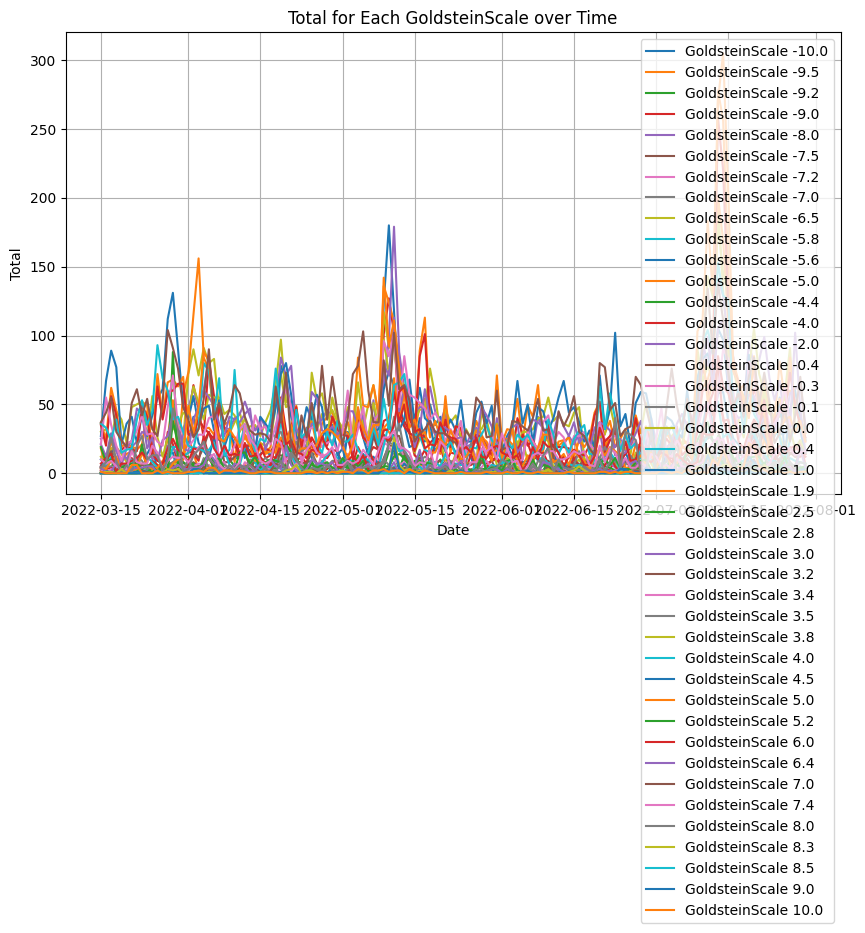

In [0]:
# PLot Goldstein Scale values?
aragalaya['SQLDATE'] = pd.to_datetime(aragalaya['SQLDATE'])

gs_totals = aragalaya.groupby(['SQLDATE', 'GoldsteinScale']).size().unstack(fill_value=0)

plt.figure(figsize=(10, 6))
for quad_class in gs_totals.columns:
    plt.plot(gs_totals.index, gs_totals[quad_class], label=f'GoldsteinScale {quad_class}')

plt.xlabel('Date')
plt.ylabel('Total')
plt.title('Total for Each GoldsteinScale over Time')
plt.legend()
plt.grid(True)
plt.show()

# spike in Q1
# volume of news increases

In [0]:
actor_sentiment.head(4)

,Actor1Name,AvgTone
0,A CABINET MEETING,-4.563586
1,A US,-0.453278
2,A. L. M. ATHAULLAH,0.000000
3,ABBOT,4.306220


In [0]:
#actors analysis

actors_data = aragalaya[['Actor1Name', 'AvgTone', 'SQLDATE']]
actors_data['SQLDATE'] = pd.to_datetime(actors_data['SQLDATE'])

# Group by actor and time period
#actors_data['EventWeek'] = actors_data['SQLDATE'].dt.to_period('W')
actor_sentiment = actors_data.groupby(['Actor1Name', 'SQLDATE'])['AvgTone'].mean().reset_index()



/root/.ipykernel/3905/command-1929783340378892-2951752789:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actors_data['SQLDATE'] = pd.to_datetime(actors_data['SQLDATE'])


In [0]:
def plot_actor_sentiment(actor_name):
    actor_df = actor_sentiment[actor_sentiment['Actor1Name'] == actor_name]
    plt.figure(figsize=(12, 6))
    plt.plot(actor_df['SQLDATE'].astype(str), actor_df['AvgTone'], marker='o')
    plt.title(f'Sentiment Over Time for {actor_name}')
    plt.xlabel('Time')
    plt.ylabel('Average Tone')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()

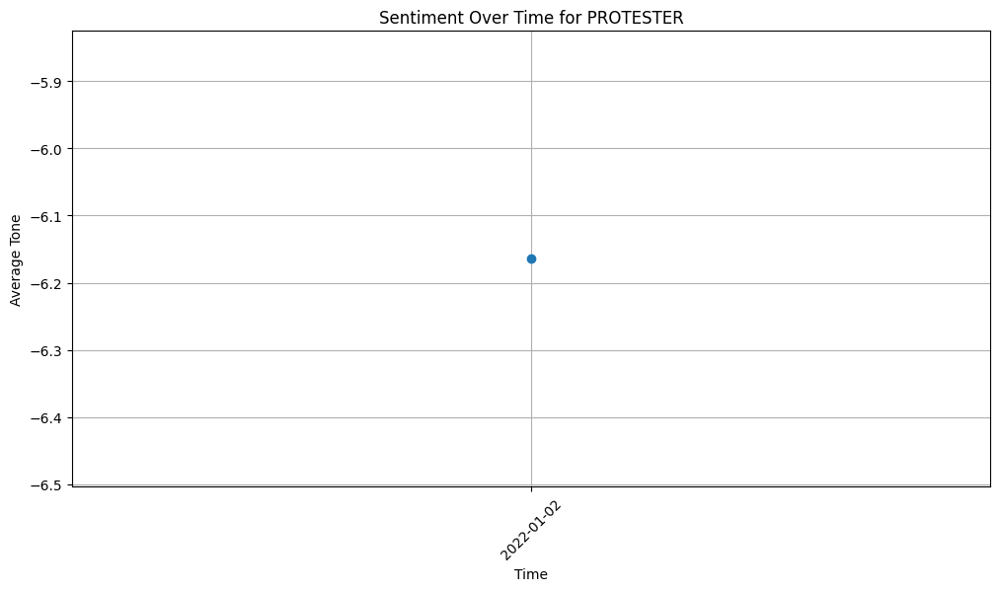

In [0]:
plot_actor_sentiment('PROTESTER')


In [0]:
actors_data = Jan_data[['Actor1Name', 'AvgTone', 'SQLDATE']]
actors_data['SQLDATE'] = pd.to_datetime(actors_data['SQLDATE'])

# Group by actor and time period
#actors_data['EventWeek'] = actors_data['SQLDATE'].dt.to_period('W')
actor_sentiment = actors_data.groupby(['Actor1Name', 'SQLDATE'])['AvgTone'].mean().reset_index()

/root/.ipykernel/1124/command-210369563966480-3007548731:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actors_data['SQLDATE'] = pd.to_datetime(actors_data['SQLDATE'])


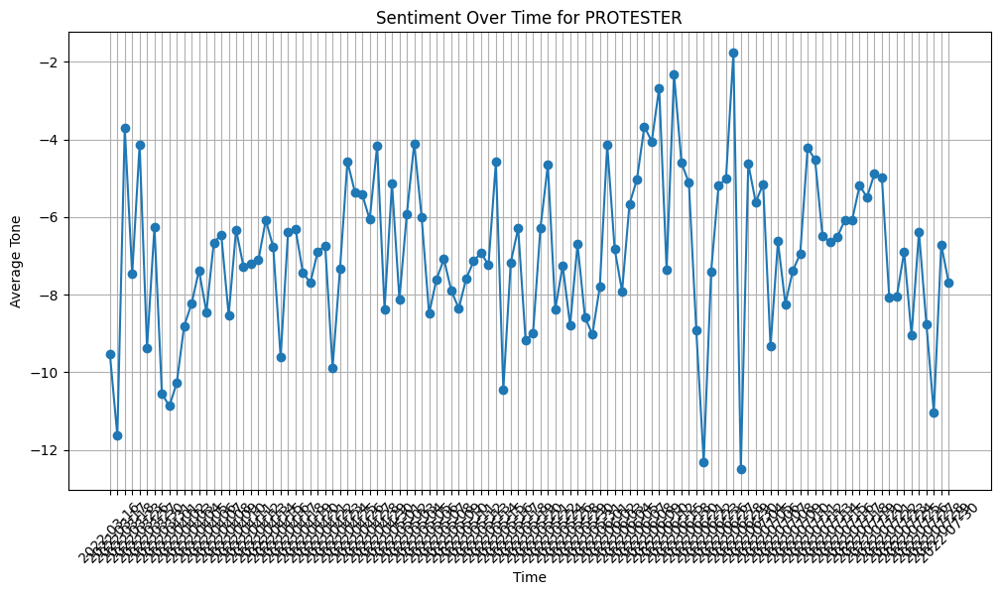

In [0]:
plot_actor_sentiment('PROTESTER')

#Citizen - average tone increases negative - positive
#Key negative sentiments - low points in Citizen - before key incidents. 
#Government - generally negative

#For key state actors, mostly negative sentiment over time.

In [0]:
#aragalaya.Actor1Name.unique()

unique_actors = aragalaya['Actor1Name'].value_counts()
unique_actors

SRI LANKA                                                  22689
SRI LANKAN                                                  4822
COLOMBO                                                     3371
PRESIDENT                                                   3246
GOVERNMENT                                                  3056
PROTESTER                                                   2289
PRIME MINISTER                                              2198
POLICE                                                      1738
CHINA                                                       1223
PARLIAMENT                                                   910
LEADING NEWS                                                 824
MINIST                                                       771
INTERNATIONAL MONETARY FUND                                  767
SINGAPORE                                                    711
MALDIVE                                                      693
TAMIL                    

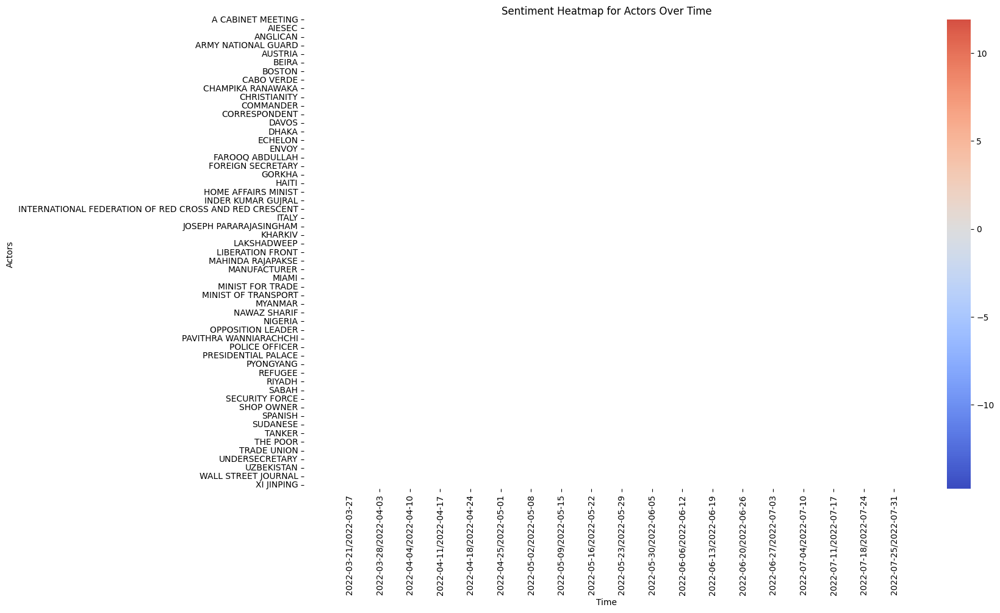

In [0]:
#Heatmap - sentiment for multiple actors
# 
heatmap_data = actor_sentiment.pivot(index='EventWeek', columns='Actor1Name', values='AvgTone')

# Plot heatmap
plt.figure(figsize=(16, 10))
sns.heatmap(heatmap_data.T, cmap='coolwarm', center=0)
plt.title('Sentiment Heatmap for Actors Over Time')
plt.xlabel('Time')
plt.ylabel('Actors')
plt.show()

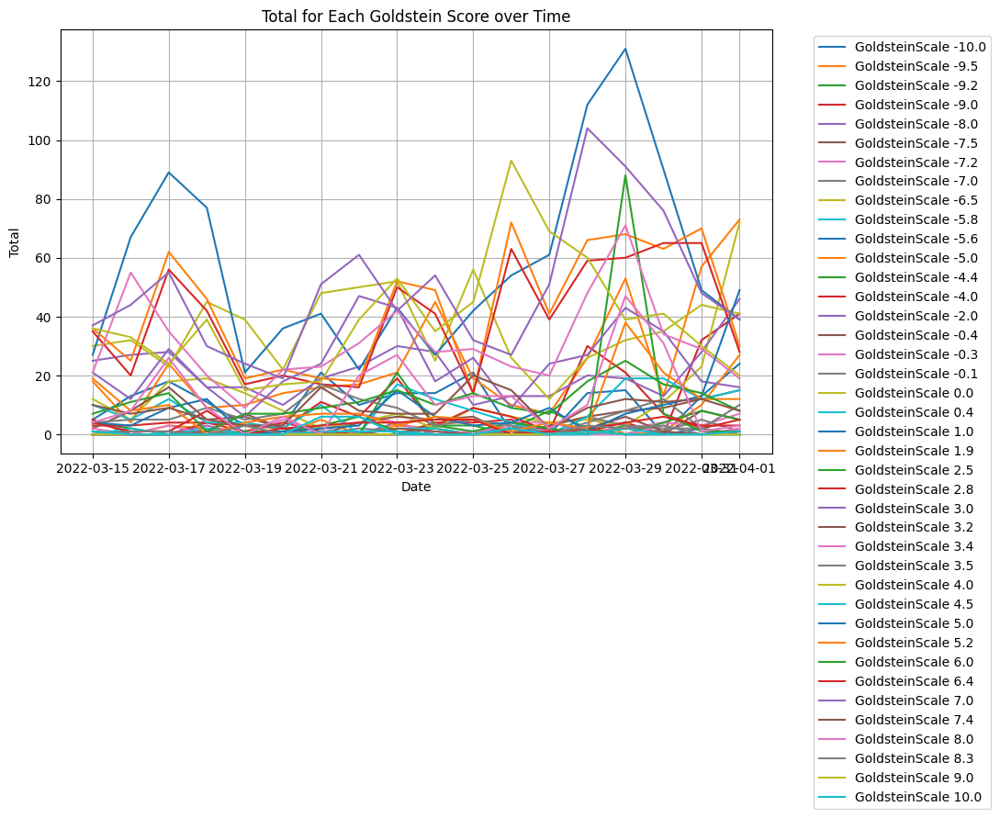

In [0]:
# Group the data by Date and GOLDSTEIN, then calculate the total for each QuadClass on each date
GoldsteinScale_totals = March_data.groupby(['SQLDATE', 'GoldsteinScale']).size().unstack(fill_value=0)

plt.figure(figsize=(10, 6))
for quad_class in GoldsteinScale_totals.columns:
    plt.plot(GoldsteinScale_totals.index, GoldsteinScale_totals[quad_class], label=f'GoldsteinScale {quad_class}')

plt.xlabel('Date')
plt.ylabel('Total')
plt.title('Total for Each Goldstein Score over Time')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

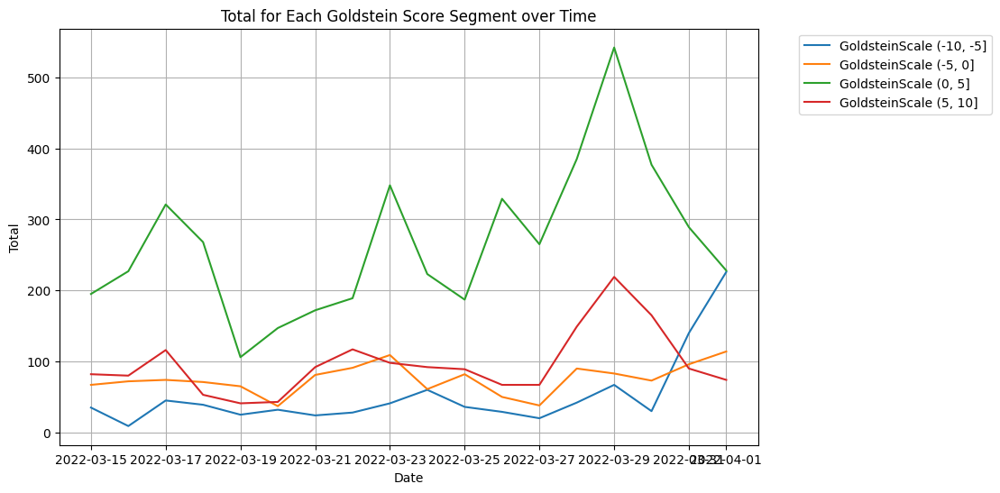

In [0]:
# Define bins for the Goldstein Scale
bins = [-10, -5, 0, 5, 10]

# Group the data by Date and Goldstein Scale segment, then calculate the total for each segment on each date
GoldsteinScale_totals = March_data.groupby([pd.Grouper(key='SQLDATE', freq='D'), pd.cut(March_data['GoldsteinScale'], bins=bins)]).size().unstack(fill_value=0)

# Plot the totals for each Goldstein Scale segment over time
plt.figure(figsize=(10, 6))
for segment in GoldsteinScale_totals.columns:
    plt.plot(GoldsteinScale_totals.index, GoldsteinScale_totals[segment], label=f'GoldsteinScale {segment}')

plt.xlabel('Date')
plt.ylabel('Total')
plt.title('Total for Each Goldstein Score Segment over Time')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

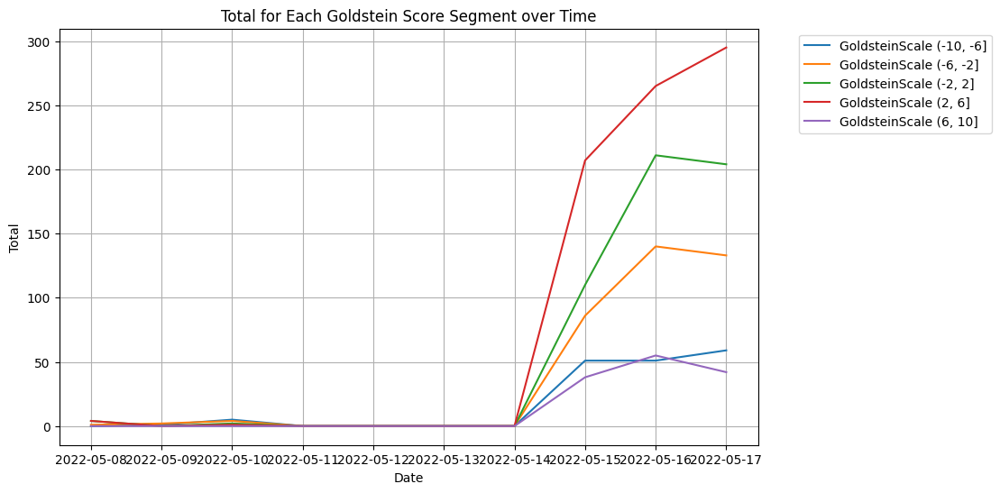

In [0]:
# Define bins for the Goldstein Scale
bins = [-10, -6, -2, 2, 6, 10]

# Group the data by Date and Goldstein Scale segment, then calculate the total for each segment on each date
GoldsteinScale_totals = preCoup.groupby([pd.Grouper(key='SQLDATE', freq='D'), pd.cut(preCoup['GoldsteinScale'], bins=bins)]).size().unstack(fill_value=0)

# Plot the totals for each Goldstein Scale segment over time
plt.figure(figsize=(10, 6))
for segment in GoldsteinScale_totals.columns:
    plt.plot(GoldsteinScale_totals.index, GoldsteinScale_totals[segment], label=f'GoldsteinScale {segment}')

plt.xlabel('Date')
plt.ylabel('Total')
plt.title('Total for Each Goldstein Score Segment over Time')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

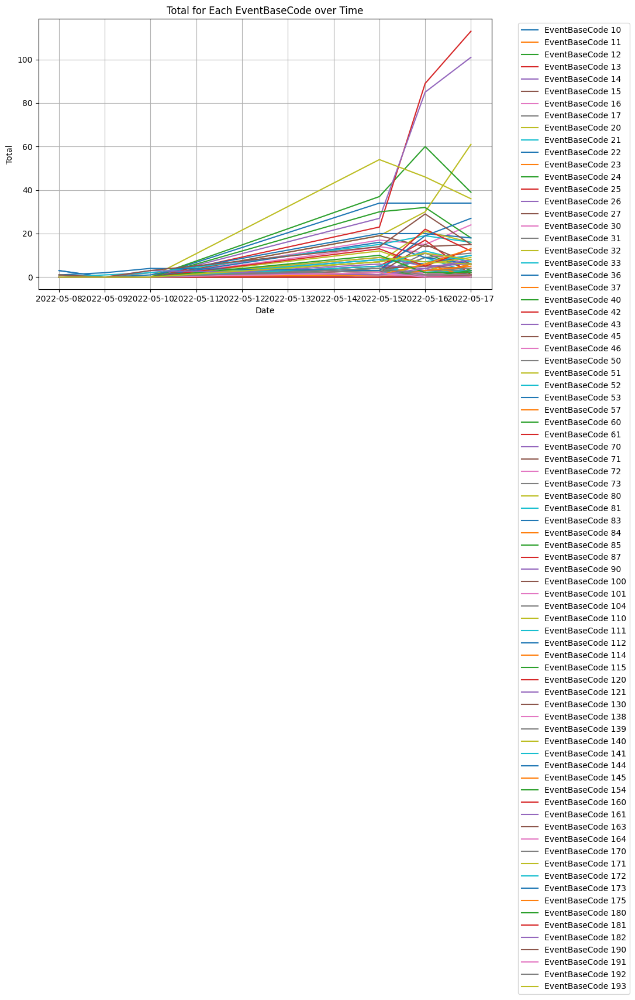

In [0]:
# Group the data by Date and EVENT BASE CODE, then calculate the total for each QuadClass on each date
EventCode_totals = preCoup.groupby(['SQLDATE', 'EventBaseCode']).size().unstack(fill_value=0)

plt.figure(figsize=(10, 6))
for quad_class in EventCode_totals.columns:
    plt.plot(EventCode_totals.index, EventCode_totals[quad_class], label=f'EventBaseCode {quad_class}')

plt.xlabel('Date')
plt.ylabel('Total')
plt.title('Total for Each EventBaseCode over Time')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

# Need to filter or cluster by Event Code

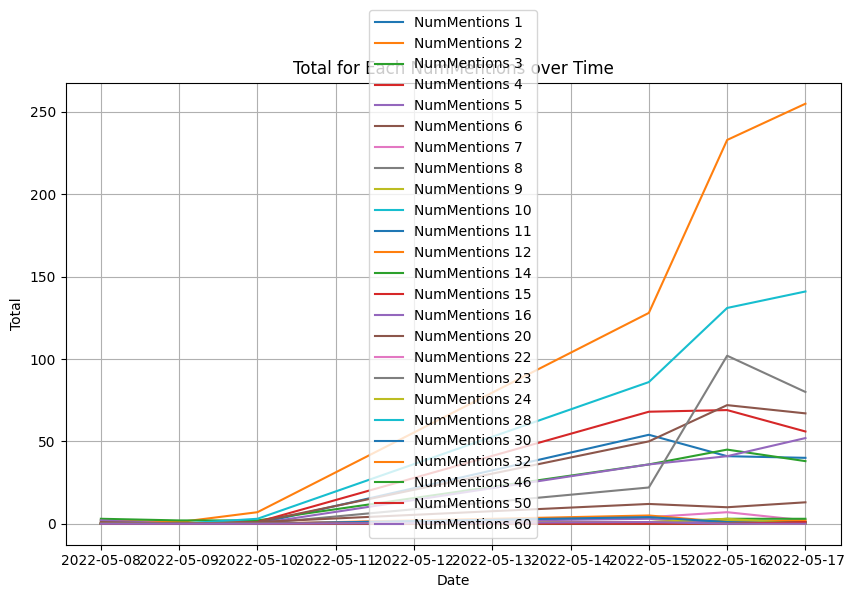

In [0]:
# Group the data by Date and QuadClass, then calculate the total for each QuadClass on each date
quadclass_totals = preCoup.groupby(['SQLDATE', 'NumMentions']).size().unstack(fill_value=0)

plt.figure(figsize=(10, 6))
for quad_class in quadclass_totals.columns:
    plt.plot(quadclass_totals.index, quadclass_totals[quad_class], label=f'NumMentions {quad_class}')

plt.xlabel('Date')
plt.ylabel('Total')
plt.title('Total for Each NumMentions over Time')
plt.legend()
plt.grid(True)
plt.show()

# spikes in material and verbal conflicts together?

In [0]:
Quad34.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1091 entries, 0 to 4447
Data columns (total 58 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   GLOBALEVENTID          1091 non-null   int64         
 1   SQLDATE                1091 non-null   datetime64[ns]
 2   Actor1Code             1050 non-null   object        
 3   Actor1Name             1050 non-null   object        
 4   Actor1CountryCode      642 non-null    object        
 5   Actor1KnownGroupCode   20 non-null     object        
 6   Actor1EthnicCode       17 non-null     object        
 7   Actor1Religion1Code    6 non-null      object        
 8   Actor1Religion2Code    1 non-null      object        
 9   Actor1Type1Code        503 non-null    object        
 10  Actor1Type2Code        35 non-null     object        
 11  Actor1Type3Code        0 non-null      object        
 12  Actor2Code             899 non-null    object        
 13  Act

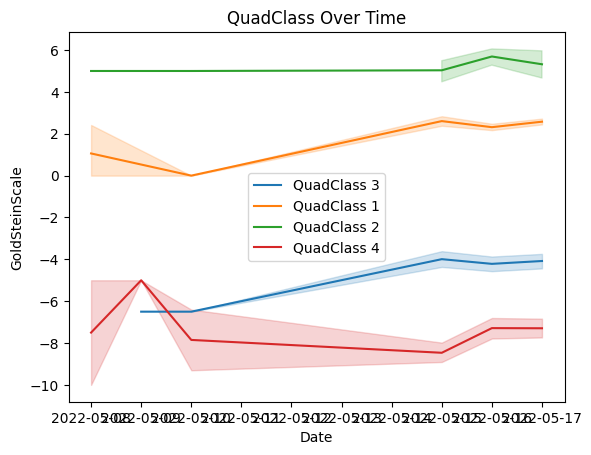

In [0]:
# Iterate over each unique QuadClass value
for quad_class in preCoup['QuadClass'].unique():
    # Filter data for the current QuadClass
    quad_class_data = preCoup[preCoup['QuadClass'] == quad_class]
    
    # Plot the data for the current QuadClass with a unique color
    sns.lineplot(x='SQLDATE', y='GoldsteinScale', data=quad_class_data, label=f'QuadClass {quad_class}')

plt.title("QuadClass Over Time")
plt.xlabel("Date")
plt.ylabel("GoldSteinScale")
plt.legend()
plt.show()

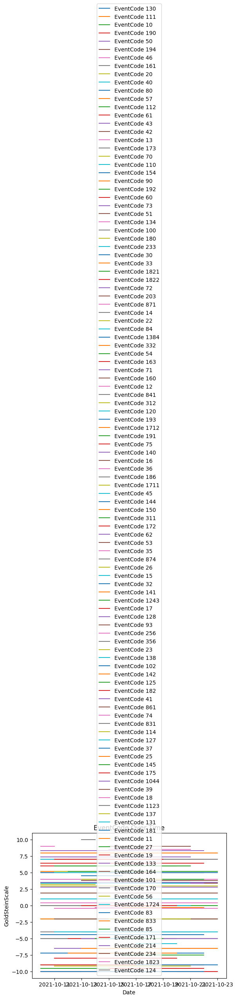

In [0]:
# Iterate over each unique QuadClass value
for quad_class in preCoup1['EventCode'].unique():
    # Filter data for the current QuadClass
    quad_class_data = preCoup1[preCoup1['EventCode'] == quad_class]
    
    # Plot the data for the current QuadClass with a unique color
    sns.lineplot(x='SQLDATE', y='GoldsteinScale', data=quad_class_data, label=f'EventCode {quad_class}')

plt.title("EventCode Over Time")
plt.xlabel("Date")
plt.ylabel("GoldSteinScale")
plt.legend()
plt.show()

In [0]:
preCoup.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4203 entries, 0 to 4449
Data columns (total 58 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   GLOBALEVENTID          4203 non-null   int64         
 1   SQLDATE                4203 non-null   datetime64[ns]
 2   Actor1Code             3958 non-null   object        
 3   Actor1Name             3958 non-null   object        
 4   Actor1CountryCode      2726 non-null   object        
 5   Actor1KnownGroupCode   86 non-null     object        
 6   Actor1EthnicCode       26 non-null     object        
 7   Actor1Religion1Code    33 non-null     object        
 8   Actor1Religion2Code    10 non-null     object        
 9   Actor1Type1Code        1682 non-null   object        
 10  Actor1Type2Code        132 non-null    object        
 11  Actor1Type3Code        1 non-null      object        
 12  Actor2Code             3577 non-null   object        
 13  Act

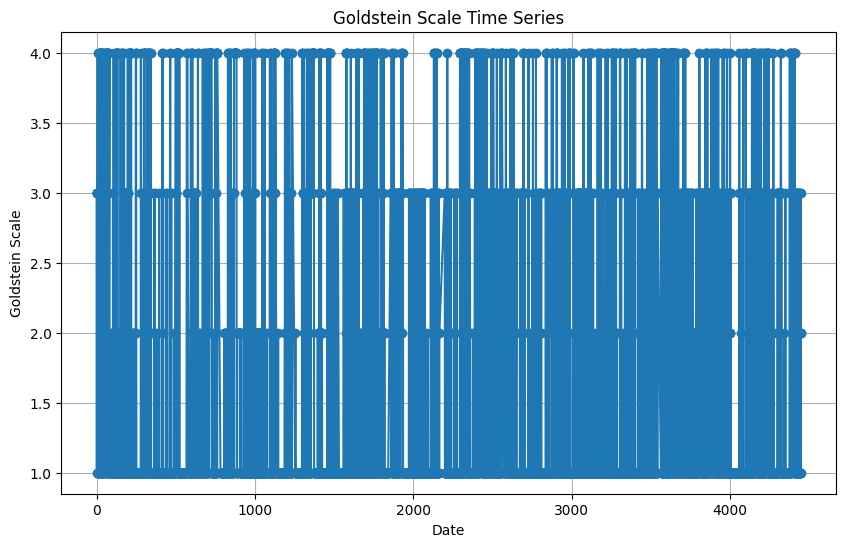

In [0]:
# Plot the time series
plt.figure(figsize=(10, 6))
plt.plot(preCoup.index, preCoup['QuadClass'], marker='o', linestyle='-')
plt.title('Goldstein Scale Time Series')
plt.xlabel('Date')
plt.ylabel('Goldstein Scale')
plt.grid(True)
plt.show()

In [0]:
gdelt_data_full_search["SQLDATE"].value_counts()

---------------------------------------------------------------------------
KeyError                                  Traceback (most recent call last)
File /databricks/python/lib/python3.10/site-packages/pandas/core/indexes/base.py:3802, in Index.get_loc(self, key, method, tolerance)
   3801 try:
-> 3802     return self._engine.get_loc(casted_key)
   3803 except KeyError as err:

File /databricks/python/lib/python3.10/site-packages/pandas/_libs/index.pyx:138, in pandas._libs.index.IndexEngine.get_loc()

File /databricks/python/lib/python3.10/site-packages/pandas/_libs/index.pyx:165, in pandas._libs.index.IndexEngine.get_loc()

File pandas/_libs/hashtable_class_helper.pxi:5745, in pandas._libs.hashtable.PyObjectHashTable.get_item()

File pandas/_libs/hashtable_class_helper.pxi:5753, in pandas._libs.hashtable.PyObjectHashTable.get_item()

KeyError: 'SQLDATE'

The above exception was the direct cause of the following exception:

KeyError                                  Traceback (most r

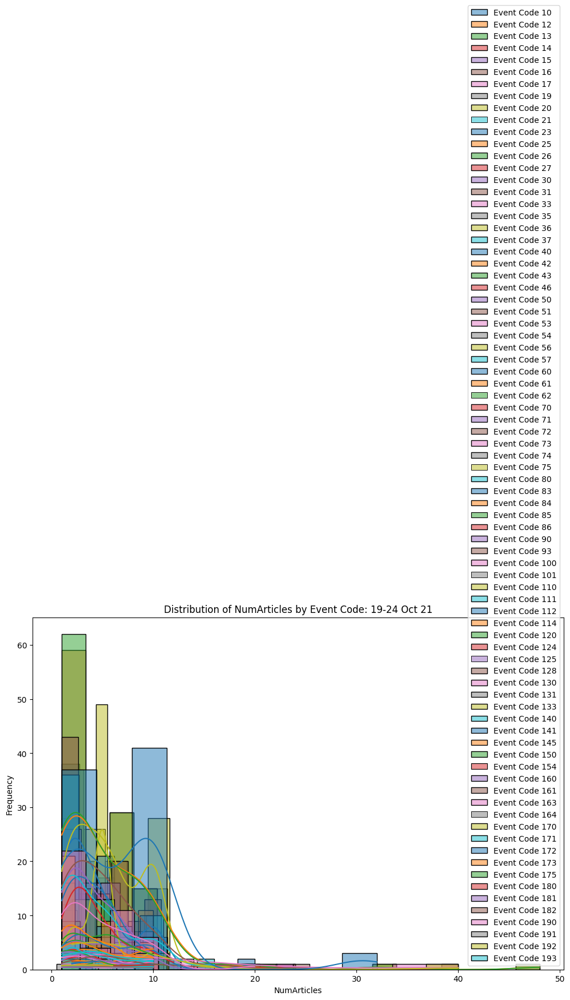

In [0]:

# Segmentation Analysis
# Segment the data based on event types (event codes)
event_segments = gdelt_data_full_search.groupby("EventBaseCode")

# Plot distribution of Goldstein Scale values within each segment
plt.figure(figsize=(12, 8))
for event_code, group in event_segments:
    sns.histplot(group["NumArticles"], kde=True, label=f"Event Code {event_code}", alpha=0.5)
plt.title("Distribution of NumArticles by Event Code: 19-24 Oct 21")
plt.xlabel("NumArticles")
plt.ylabel("Frequency")
plt.legend()
plt.show()

In [0]:
gdelt_data_full_search.head(5)

,GLOBALEVENTID,SQLDATE,Actor1Code,Actor1Name,Actor1CountryCode,Actor1KnownGroupCode,Actor1EthnicCode,Actor1Religion1Code,Actor1Religion2Code,Actor1Type1Code,Actor1Type2Code,Actor1Type3Code,Actor2Code,Actor2Name,Actor2CountryCode,Actor2KnownGroupCode,Actor2EthnicCode,Actor2Religion1Code,Actor2Religion2Code,Actor2Type1Code,Actor2Type2Code,Actor2Type3Code,IsRootEvent,EventCode,EventBaseCode,EventRootCode,QuadClass,GoldsteinScale,NumMentions,NumSources,NumArticles,AvgTone,Actor1Geo_Type,Actor1Geo_FullName,Actor1Geo_CountryCode,Actor1Geo_ADM1Code,Actor1Geo_ADM2Code,Actor1Geo_Lat,Actor1Geo_Long,Actor1Geo_FeatureID,Actor2Geo_Type,Actor2Geo_FullName,Actor2Geo_CountryCode,Actor2Geo_ADM1Code,Actor2Geo_ADM2Code,Actor2Geo_Lat,Actor2Geo_Long,Actor2Geo_FeatureID,ActionGeo_Type,ActionGeo_FullName,ActionGeo_CountryCode,ActionGeo_ADM1Code,ActionGeo_ADM2Code,ActionGeo_Lat,ActionGeo_Long,ActionGeo_FeatureID,DATEADDED,SOURCEURL
0,1009885263,20211019,USA,UNITED STATES,USA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,20,20,2,1,3.0,4,1,4,1.547231,2,"Texas, United States",US,USTX,NaN,31.1060,-97.6475,TX,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,"Kordofan, Shamal Kurdufan, Sudan",SU,SU56,37089,13.0833,30.3500,-9440,20211019000000,https://artdaily.com/news/140336/-On-the-Horiz...
1,1009891825,20211019,COP,RIOT POLICE,NaN,NaN,NaN,NaN,NaN,COP,NaN,NaN,GOV,GOVERNMENT,NaN,NaN,NaN,NaN,NaN,GOV,NaN,NaN,0,180,180,18,4,-9.0,10,1,10,-6.423358,4,"Khartoum, Al Khartum, Sudan",SU,SU29,37069,15.5881,32.5342,-1987,4,"Khartoum, Al Khartum, Sudan",SU,SU29,37069,15.5881,32.5342,-1987,4,"Khartoum, Al Khartum, Sudan",SU,SU29,37069,15.5881,32.5342,-1987,20211019004500,http://www.msn.com/en-xl/news/newsworld/sudans...
2,1009892238,20211019,GOV,AUTHORITIES,NaN,NaN,NaN,NaN,NaN,GOV,NaN,NaN,SDN,SUDAN,SDN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,43,43,4,1,2.8,4,1,4,-6.423358,4,"Darfur, Gharb Darfur, Sudan",SU,SU47,37140,13.5000,23.5000,-17505,4,"Darfur, Gharb Darfur, Sudan",SU,SU47,37140,13.5000,23.5000,-17505,4,"Darfur, Gharb Darfur, Sudan",SU,SU47,37140,13.5000,23.5000,-17505,20211019004500,http://www.msn.com/en-xl/news/newsworld/sudans...
3,1009892413,20211019,ISR,ISRAEL,ISR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SDN,SUDAN,SDN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,50,50,5,1,3.5,1,1,1,3.485839,4,"Jerusalem, Israel (general), Israel",IS,IS00,18315,31.7667,35.2333,-797092,4,"Jerusalem, Israel (general), Israel",IS,IS00,18315,31.7667,35.2333,-797092,1,Sudan,SU,SU,NaN,16.0000,30.0000,SU,20211019004500,https://www.israelnationalnews.com/News/News.a...
4,1009892414,20211019,ISR,ISRAEL,ISR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SDN,SUDAN,SDN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,50,50,5,1,3.5,3,1,3,3.485839,4,"Jerusalem, Israel (general), Israel",IS,IS00,18315,31.7667,35.2333,-797092,1,Sudan,SU,SU,NaN,16.0000,30.0000,SU,1,Sudan,SU,SU,NaN,16.0000,30.0000,SU,20211019004500,https://www.israelnationalnews.com/News/News.a...


In [0]:
gdelt_data_full_search.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1676 entries, 0 to 1675
Data columns (total 58 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   GLOBALEVENTID          1676 non-null   int64  
 1   SQLDATE                1676 non-null   int64  
 2   Actor1Code             1568 non-null   object 
 3   Actor1Name             1568 non-null   object 
 4   Actor1CountryCode      989 non-null    object 
 5   Actor1KnownGroupCode   18 non-null     object 
 6   Actor1EthnicCode       17 non-null     object 
 7   Actor1Religion1Code    11 non-null     object 
 8   Actor1Religion2Code    4 non-null      object 
 9   Actor1Type1Code        736 non-null    object 
 10  Actor1Type2Code        59 non-null     object 
 11  Actor1Type3Code        0 non-null      object 
 12  Actor2Code             1412 non-null   object 
 13  Actor2Name             1412 non-null   object 
 14  Actor2CountryCode      848 non-null    object 
 15  Acto

In [0]:
x = gdelt_data_full_search.EventCode.unique()
x

array([  51,   20,   40,  112,  141,  841,  120,   10,   16,   57,  140,
         42,   43,   46,  100,   71,   30,   13,   80,   61,  241,   36,
        190,   14,   50,  191,  192,   70,  110,  173,   84,   60,  130,
        160,   90,  175,   31, 1724,  154,  231,  144,  161,   45,  111,
         53,  133,   12,  172,   17,   62,  138,   22, 1053,  874,   27,
        831,  114,   52,  193,   25,  253,   85,   26,   72,   54, 1123,
        182, 1723,  139,  180,  124,  356,  202,   73,  174,  243,   37,
        256,   33, 1411,   87, 1044,  162,   75,  871,  150, 1711,  181,
         11, 1056,  143, 1821,  164,   44,  183,   32, 1124, 1721,  128,
        833,  186,  333,  163, 1384,   81,  115,  127, 1312,  170,  353,
        214,  145,  203, 1822,   63,   23])

In [0]:
len(x)

116

In [0]:
pd.set_option('display.max_rows', None)

In [0]:
gdelt_data_full_search["EventCode"].value_counts() #19-24 Oct'21

40      556
20      516
173     380
111     358
10      349
12      344
51      289
141     242
46      218
42      204
43      191
50      180
190     175
36      124
30      117
112     113
57       99
253      97
84       96
110      94
120      83
13       75
160      68
100      68
60       68
130      65
191      63
62       61
1053     54
841      53
25       51
1724     48
193      46
154      44
162      44
26       41
80       39
70       35
175      34
71       28
52       27
140      22
72       21
138      20
133      20
90       20
180      20
114      18
14       17
831      17
172      16
874      13
144      13
73       12
53       11
45       11
161      11
192      10
22        9
333       9
182       7
139       7
17        6
150       6
16        6
181       6
183       6
1124      6
11        5
143       5
75        5
61        5
871       5
356       4
1721      4
833       4
31        4
37        4
44        4
127       4
1411      4
27        4
1123      4
54  

In [0]:
#EDA



In [0]:
gdelt_data_full_search.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6301 entries, 0 to 6300
Data columns (total 58 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   GLOBALEVENTID          6301 non-null   object
 1   SQLDATE                6301 non-null   object
 2   Actor1Code             6301 non-null   object
 3   Actor1Name             6301 non-null   object
 4   Actor1CountryCode      6301 non-null   object
 5   Actor1KnownGroupCode   6301 non-null   object
 6   Actor1EthnicCode       6301 non-null   object
 7   Actor1Religion1Code    6301 non-null   object
 8   Actor1Religion2Code    6301 non-null   object
 9   Actor1Type1Code        6301 non-null   object
 10  Actor1Type2Code        6301 non-null   object
 11  Actor1Type3Code        6301 non-null   object
 12  Actor2Code             6301 non-null   object
 13  Actor2Name             6301 non-null   object
 14  Actor2CountryCode      6301 non-null   object
 15  Actor2KnownGroupCode 

In [0]:
# define schema -- data is messy, so cast everything as string for now
schema = [StructField(col, StringType(), True) for col in gdelt_data_full_search.columns]

In [0]:
schema

[StructField('GLOBALEVENTID', StringType(), True),
 StructField('SQLDATE', StringType(), True),
 StructField('Actor1Code', StringType(), True),
 StructField('Actor1Name', StringType(), True),
 StructField('Actor1CountryCode', StringType(), True),
 StructField('Actor1KnownGroupCode', StringType(), True),
 StructField('Actor1EthnicCode', StringType(), True),
 StructField('Actor1Religion1Code', StringType(), True),
 StructField('Actor1Religion2Code', StringType(), True),
 StructField('Actor1Type1Code', StringType(), True),
 StructField('Actor1Type2Code', StringType(), True),
 StructField('Actor1Type3Code', StringType(), True),
 StructField('Actor2Code', StringType(), True),
 StructField('Actor2Name', StringType(), True),
 StructField('Actor2CountryCode', StringType(), True),
 StructField('Actor2KnownGroupCode', StringType(), True),
 StructField('Actor2EthnicCode', StringType(), True),
 StructField('Actor2Religion1Code', StringType(), True),
 StructField('Actor2Religion2Code', StringType()

In [0]:
#convert 'GLOBALEVENTID' column to string in the pandas DataFrame
#gdelt_data_full_search['GLOBALEVENTID'] = gdelt_data_full_search['GLOBALEVENTID'].astype(str)

#convert all columns to string in the pandas DataFrame
gdelt_data_full_search = gdelt_data_full_search.astype(str)

#create Spark DataFrame with Arrow optimization
#spdf = spark.createDataFrame(gdelt_data_full_search, StructType(schema))


In [0]:
# convert to spark
spark.conf.set("spark.sql.execution.arrow.pyspark.enabled", "true")
spdf = spark.createDataFrame(gdelt_data_full_search, StructType(schema))

In [0]:
# save output
spdf.write.mode('append').format('delta').saveAsTable("{}.{}".format(DATABASE_NAME, EVENT_TABLE))

In [0]:
# save error table if any
if error_df.shape[0] > 0:
    print('Number of errors:', error_df.shape[0])
    eschema = [StructField(col, StringType(), True) for col in error_df.columns]
    spedf = spark.createDataFrame(error_df, StructType(eschema))
    spedf.write.mode('append').format('delta').saveAsTable("{}.{}".format(DATABASE_NAME, ERROR_TABLE))

In [0]:
spdf = spark.table("{}.{}".format(DATABASE_NAME, EVENT_TABLE))


In [0]:
display(spdf)

GLOBALEVENTID,SQLDATE,Actor1Code,Actor1Name,Actor1CountryCode,Actor1KnownGroupCode,Actor1EthnicCode,Actor1Religion1Code,Actor1Religion2Code,Actor1Type1Code,Actor1Type2Code,Actor1Type3Code,Actor2Code,Actor2Name,Actor2CountryCode,Actor2KnownGroupCode,Actor2EthnicCode,Actor2Religion1Code,Actor2Religion2Code,Actor2Type1Code,Actor2Type2Code,Actor2Type3Code,IsRootEvent,EventCode,EventBaseCode,EventRootCode,QuadClass,GoldsteinScale,NumMentions,NumSources,NumArticles,AvgTone,Actor1Geo_Type,Actor1Geo_FullName,Actor1Geo_CountryCode,Actor1Geo_ADM1Code,Actor1Geo_ADM2Code,Actor1Geo_Lat,Actor1Geo_Long,Actor1Geo_FeatureID,Actor2Geo_Type,Actor2Geo_FullName,Actor2Geo_CountryCode,Actor2Geo_ADM1Code,Actor2Geo_ADM2Code,Actor2Geo_Lat,Actor2Geo_Long,Actor2Geo_FeatureID,ActionGeo_Type,ActionGeo_FullName,ActionGeo_CountryCode,ActionGeo_ADM1Code,ActionGeo_ADM2Code,ActionGeo_Lat,ActionGeo_Long,ActionGeo_FeatureID,DATEADDED,SOURCEURL
1011081814,20211026,SDN,KHARTOUM,SDN,nan,nan,nan,nan,nan,nan,nan,ETH,ADDIS ABABA,ETH,nan,nan,nan,nan,nan,nan,nan,0,110,110,11,3,-2.0,1,1,1,-5.24737631184408,4,"Khartoum, Al Khartum, Sudan",SU,SU29,37069,15.5881,32.5342,-1987,4,"Khartoum, Al Khartum, Sudan",SU,SU29,37069,15.5881,32.5342,-1987,4,"Oromo, Amara, Ethiopia",ET,ET46,40799,11.8667,39.7333,-618300,20211026070000,https://allafrica.com/stories/202110260064.html
1011081815,20211026,SDN,SUDANESE,SDN,nan,nan,nan,nan,nan,nan,nan,INT,INTERNATIONAL COMMUNITY,nan,nan,nan,nan,nan,INT,nan,nan,1,111,111,11,3,-2.0,16,1,16,-8.16901408450704,4,"Khartoum, Al Khartum, Sudan",SU,SU29,37069,15.5881,32.5342,-1987,4,"Khartoum, Al Khartum, Sudan",SU,SU29,37069,15.5881,32.5342,-1987,4,"Khartoum, Al Khartum, Sudan",SU,SU29,37069,15.5881,32.5342,-1987,20211026070000,https://www.gulf-times.com/story/703113/Sudanese-take-to-the-streets-as-international-comm
1011081902,20211026,USA,UNITED STATES,USA,nan,nan,nan,nan,nan,nan,nan,COP,SECURITY FORCE,nan,nan,nan,nan,nan,COP,nan,nan,0,12,12,1,1,-0.4,3,1,3,-4.75409836065574,4,"Khartoum, Al Khartum, Sudan",SU,SU29,37069,15.5881,32.5342,-1987,4,"Khartoum, Al Khartum, Sudan",SU,SU29,37069,15.5881,32.5342,-1987,4,"Khartoum, Al Khartum, Sudan",SU,SU29,37069,15.5881,32.5342,-1987,20211026070000,https://www.thejournal.ie/security-council-expected-to-hold-emergency-sudan-meeting-5583966-Oct2021/
1011081952,20211026,USA,UNITED STATES,USA,nan,nan,nan,nan,nan,nan,nan,SDN,SUDANESE,SDN,nan,nan,nan,nan,nan,nan,nan,0,111,111,11,3,-2.0,4,1,4,-8.16901408450704,2,"New York, United States",US,USNY,nan,42.1497,-74.9384,NY,4,"Khartoum, Al Khartum, Sudan",SU,SU29,37069,15.5881,32.5342,-1987,2,"New York, United States",US,USNY,nan,42.1497,-74.9384,NY,20211026070000,https://www.gulf-times.com/story/703113/Sudanese-take-to-the-streets-as-international-comm
1011081953,20211026,USA,THE US,USA,nan,nan,nan,nan,nan,nan,nan,SDN,SUDAN,SDN,nan,nan,nan,nan,nan,nan,nan,0,162,162,16,4,-5.6,10,1,10,-4.75409836065574,4,"Khartoum, Al Khartum, Sudan",SU,SU29,37069,15.5881,32.5342,-1987,4,"Khartoum, Al Khartum, Sudan",SU,SU29,37069,15.5881,32.5342,-1987,4,"Khartoum, Al Khartum, Sudan",SU,SU29,37069,15.5881,32.5342,-1987,20211026070000,https://www.thejournal.ie/security-council-expected-to-hold-emergency-sudan-meeting-5583966-Oct2021/
1011082878,20211026,COP,SECURITY FORCE,nan,nan,nan,nan,nan,COP,nan,nan,SDN,SUDANESE,SDN,nan,nan,nan,nan,nan,nan,nan,0,20,20,2,1,3.0,4,1,4,-4.35865504358655,4,"Khartoum, Al Khartum, Sudan",SU,SU29,37069,15.5881,32.5342,-1987,4,"Khartoum, Al Khartum, Sudan",SU,SU29,37069,15.5881,32.5342,-1987,4,"Khartoum, Al Khartum, Sudan",SU,SU29,37069,15.5881,32.5342,-1987,20211026071500,https://www.msn.com/en-gb/news/world/sudans-coup-is-an-act-of-defiance-towards-the-uk-and-us/ar-AAPXwVF
1011082879,20211026,COP,SECURITY FORCE,nan,nan,nan,nan,nan,COP,nan,nan,SDNCVL,SUDANESE,SDN,nan,nan,nan,nan,CVL,nan,nan,0,20,20,2,1,3.0,6,1,6,-4.35865504358655,4,"Khartoum, Al Khartum, Sudan",SU,SU29,37069,15.5881,32.5342,-1987,4,"Khartoum, Al Khartum, Sudan",SU,SU29,37069,15.5881,32.5342,-19